# Store Sales Eda, Modelisation And Prediction Test-set

In [1]:
%load_ext nb_black
%load_ext pycodestyle_magic
%pycodestyle_on

<IPython.core.display.Javascript object>

I thank the authors of these notebooks for their knowledge and help on this kaggle competition (Store Sales - Time Series Forecasting).
 
This is my first Kaggle, and I wanted to excercise myself in the field of time series prediction, as I am a beginner in this field.

This notebook will be presented in 3 parts.
An exploratory analysis on my different variables (allowing to explain the relations of different components on my variable Target "sales"°)
Several modeling analyses 
And a prediction analysis of my Test samples.

https://www.kaggle.com/code/ilyakondrusevich/54-stores-54-models

https://www.kaggle.com/code/andrej0marinchenko/hyperparamaters

In [345]:
# Librairie
# importation librarie
import matplotlib as plt
import matplotlib.pyplot as plt  # For use legend, xlabel, ylabel on plt
import numpy as np
import scipy as sp
import sklearn
from IPython.display import display
import pandas as pd

import seaborn as sns
import missingno as msno
import pandas as pd
import calendar

import plotly.express as px
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import plotly.offline as offline
import plotly.graph_objs as go
import plotly.express as px
from pathlib import Path
from warnings import simplefilter

import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from statsmodels.tsa.deterministic import CalendarFourier, DeterministicProcess

from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import mean_squared_log_error
from xgboost import XGBRegressor
from statistics import mean

<IPython.core.display.Javascript object>

In [346]:
download_dir = Path(r"C:\Users\JbPer\Openclassroom\Projet 8\stores")

<IPython.core.display.Javascript object>

In [347]:
holidays_events = pd.read_csv(download_dir / "holidays_events.csv", sep=",")
oil = pd.read_csv(download_dir / "oil.csv", sep=",")
stores = pd.read_csv(download_dir / "stores.csv", sep=",")
test = pd.read_csv(download_dir / "test.csv", sep=",")
train = pd.read_csv(download_dir / "train.csv", sep=",")

<IPython.core.display.Javascript object>

We have 5 files, we will try to merge these files together. 
By grouping oil, store (a categorical variable that represents the store that sold the product), 
vacations and public holidays (holidays_events) on training and test data.
(The transaction values are unknown on the Test set data (this is logical). Moreover the Target variable "sales" is too dependent on them. This Transaction variable is not a good variable for our prediction analysis).

Our goal is to predict the sales of the different product families sold in the different Favorita stores. There are 54 Favorita stores in this dataset. 
There are 54 stores and my idea is to train the model on the data of each store separately.

# Processing of training data

In [348]:
train.shape

(3000888, 6)

<IPython.core.display.Javascript object>

In [349]:
holidays_events

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
6,2012-06-23,Holiday,Local,Guaranda,Cantonizacion de Guaranda,False
7,2012-06-25,Holiday,Regional,Imbabura,Provincializacion de Imbabura,False
8,2012-06-25,Holiday,Local,Latacunga,Cantonizacion de Latacunga,False
9,2012-06-25,Holiday,Local,Machala,Fundacion de Machala,False


<IPython.core.display.Javascript object>

In [350]:
oil_train = train.merge(oil, how="left", on="date")
oil_train_st = oil_train.merge(stores, how="left", on="store_nbr")
oil_train_st_h = oil_train_st.merge(holidays_events, how="left", on="date")

<IPython.core.display.Javascript object>

In [351]:
oil_train_st_h.shape

(3054348, 16)

<IPython.core.display.Javascript object>

In [352]:
oil_train_st_tr_h = oil_train_st_h.rename(
    columns={"type_x": "store_type", "type_y": "ho_or_nt"}
)

<IPython.core.display.Javascript object>

 Only the number of orders is kept to avoid duplicates (because for the same day you can get several events)

In [353]:
dt_Train = oil_train_st_tr_h.drop_duplicates(subset=["id"])
dt_Train.shape

(3000888, 16)

<IPython.core.display.Javascript object>

In [354]:
dt_Train

,id,date,store_nbr,family,sales,onpromotion,dcoilwtico,city,state,store_type,cluster,ho_or_nt,locale,locale_name,description,transferred
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False
1,1,2013-01-01,1,BABY CARE,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False
2,2,2013-01-01,1,BEAUTY,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False
3,3,2013-01-01,1,BEVERAGES,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False
4,4,2013-01-01,1,BOOKS,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3054343,3000883,2017-08-15,9,POULTRY,438.133,0,47.57,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False
3054344,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,47.57,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False
3054345,3000885,2017-08-15,9,PRODUCE,2419.729,148,47.57,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False
3054346,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,47.57,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False


<IPython.core.display.Javascript object>

In [355]:
dt_Train.date = pd.to_datetime(dt_Train.date)
dt_Train["year"] = dt_Train["date"].dt.year
dt_Train["month"] = dt_Train["date"].dt.month
dt_Train["week"] = dt_Train["date"].dt.isocalendar().week
dt_Train["quarter"] = dt_Train["date"].dt.quarter
dt_Train["day_of_week"] = dt_Train["date"].dt.day_name()

<IPython.core.display.Javascript object>

<AxesSubplot:>

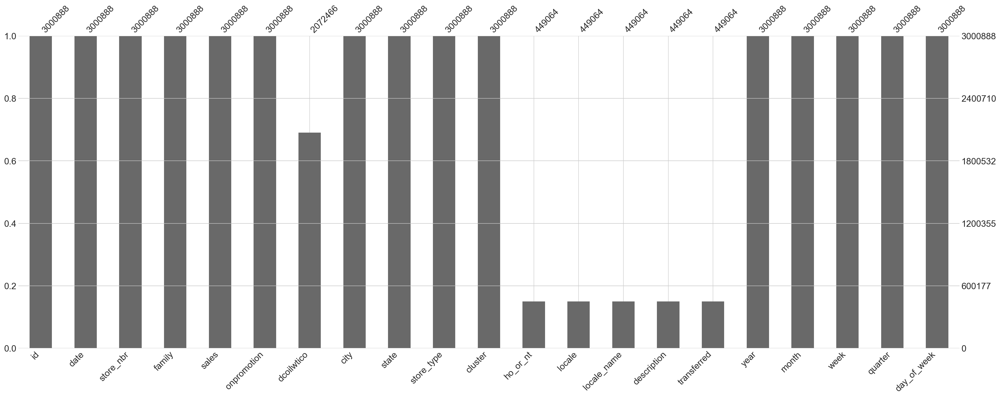

<IPython.core.display.Javascript object>

In [356]:
msno.bar(dt_Train.sample(3000888))

Here, we observe that some variables are missing (Nan value), notably the Holiday_or_not and Dcoilwtico columns.  We will have to clean up these variables for the EDA and modeling analyses.

We assume that if there are no transactions for a product, we can replace the missing values by 0

## For event variables 

In [357]:
dt_Train[["locale", "locale_name", "description"]] = dt_Train[
    ["locale", "locale_name", "description"]
].replace(np.nan, "")
dt_Train["ho_or_nt"] = dt_Train["ho_or_nt"].replace(np.nan, "Work Day")
dt_Train["transferred"] = dt_Train["transferred"].replace(np.nan, False)

<IPython.core.display.Javascript object>

In [358]:
dt_Train["ho_or_nt"] = dt_Train["ho_or_nt"].replace(np.nan, "Work Day")

<IPython.core.display.Javascript object>

### For missing essence data, we will use interpolation techniques to find the missing values 


In [359]:
dt_Train

,id,date,store_nbr,family,sales,onpromotion,dcoilwtico,city,state,store_type,cluster,ho_or_nt,locale,locale_name,description,transferred,year,month,week,quarter,day_of_week
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
1,1,2013-01-01,1,BABY CARE,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
2,2,2013-01-01,1,BEAUTY,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
3,3,2013-01-01,1,BEVERAGES,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
4,4,2013-01-01,1,BOOKS,0.000,0,NaN,Quito,Pichincha,D,13,Holiday,National,Ecuador,Primer dia del ano,False,2013,1,1,1,Tuesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3054343,3000883,2017-08-15,9,POULTRY,438.133,0,47.57,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False,2017,8,33,3,Tuesday
3054344,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,47.57,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False,2017,8,33,3,Tuesday
3054345,3000885,2017-08-15,9,PRODUCE,2419.729,148,47.57,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False,2017,8,33,3,Tuesday
3054346,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,47.57,Quito,Pichincha,B,6,Holiday,Local,Riobamba,Fundacion de Riobamba,False,2017,8,33,3,Tuesday


<IPython.core.display.Javascript object>

In [360]:
oil["date"] = pd.to_datetime(oil["date"])
oil.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.14
2,2013-01-03,92.97
3,2013-01-04,93.12
4,2013-01-07,93.20


<IPython.core.display.Javascript object>

In [361]:
# Interpolate
# Resample
oil = (
    oil.set_index("date")["dcoilwtico"].resample("D").sum().reset_index()
)  # add missing dates and fill NaNs with 0

# Interpolate
oil["dcoilwtico"] = np.where(
    oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"]
)  # replace 0 with NaN
oil[
    "dcoil_interpolated"
] = oil.dcoilwtico.interpolate()  # fill NaN values using an interpo method

oil.head(10)

,date,dcoilwtico,dcoil_interpolated
0,2013-01-01,NaN,NaN
1,2013-01-02,93.14,93.140000
2,2013-01-03,92.97,92.970000
3,2013-01-04,93.12,93.120000
4,2013-01-05,NaN,93.146667
5,2013-01-06,NaN,93.173333
6,2013-01-07,93.20,93.200000
7,2013-01-08,93.21,93.210000
8,2013-01-09,93.08,93.080000
9,2013-01-10,93.81,93.810000


<IPython.core.display.Javascript object>

In [362]:
oil.drop(["dcoilwtico"], axis=1, inplace=True)
dt_Train.drop(["dcoilwtico"], axis=1, inplace=True)
dt_Train = dt_Train.merge(oil, how="left", on="date")

<IPython.core.display.Javascript object>

<AxesSubplot:>

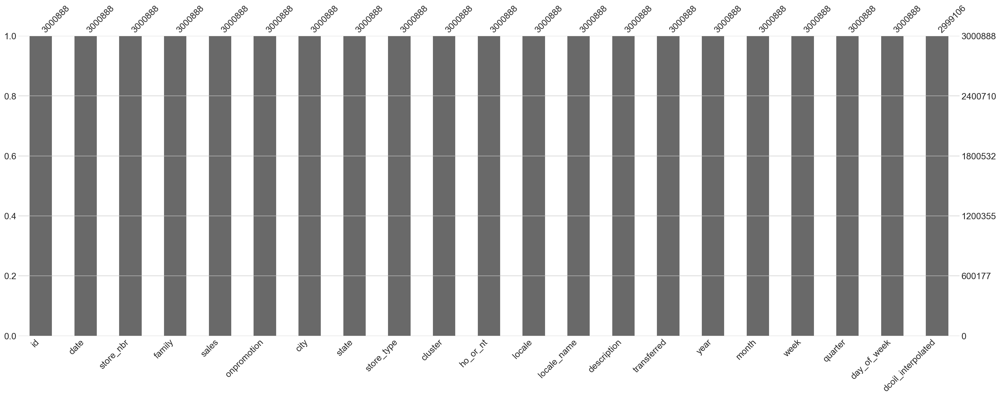

<IPython.core.display.Javascript object>

In [363]:
msno.bar(dt_Train.sample(3000888))

In [364]:
dt_Train = dt_Train.dropna(subset=["sales"])

<IPython.core.display.Javascript object>

In [365]:
dt_Train.shape

(3000888, 21)

<IPython.core.display.Javascript object>

We will do the same thing for the Test set data

In [366]:
oil = pd.read_csv(download_dir / "oil.csv", sep=",")

oil_test = test.merge(oil, how="left", on="date")
oil_test_st = oil_test.merge(stores, how="left", on="store_nbr")
oil_test_st_h = oil_test_st.merge(holidays_events, how="left", on="date")
oil_test_st_h = oil_test_st_h.rename(
    columns={"type_x": "store_type", "type_y": "ho_or_nt"}
)
dt_test = oil_test_st_h.drop_duplicates(subset=["id"])

dt_test = oil_test_st_h
dt_test.date = pd.to_datetime(dt_test.date)
dt_test["year"] = dt_test["date"].dt.year
dt_test["month"] = dt_test["date"].dt.month
dt_test["week"] = dt_test["date"].dt.isocalendar().week
dt_test["quarter"] = dt_test["date"].dt.quarter
dt_test["day_of_week"] = dt_test["date"].dt.day_name()

dt_test[["locale", "locale_name", "description"]] = dt_test[
    ["locale", "locale_name", "description"]
].replace(np.nan, "")

dt_test["ho_or_nt"] = dt_test["ho_or_nt"].replace(np.nan, "Work Day")
dt_test["transferred"] = dt_test["transferred"].replace(np.nan, False)

oil["date"] = pd.to_datetime(oil["date"])
oil = (
    oil.set_index("date")["dcoilwtico"].resample("D").sum().reset_index()
)  # add missing dates and fill NaNs with 0

# Interpolate
oil["dcoilwtico"] = np.where(
    oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"]
)  # replace 0 with NaN
oil[
    "dcoil_interpolated"
] = oil.dcoilwtico.interpolate()  # fill NaN values using interpolation method
oil.drop(["dcoilwtico"], axis=1, inplace=True)
dt_test.drop(["dcoilwtico"], axis=1, inplace=True)
dt_test = dt_test.merge(oil, how="left", on="date")

<IPython.core.display.Javascript object>

In [367]:
dt_test

,id,date,store_nbr,family,onpromotion,city,state,store_type,cluster,ho_or_nt,locale,locale_name,description,transferred,year,month,week,quarter,day_of_week,dcoil_interpolated
0,3000888,2017-08-16,1,AUTOMOTIVE,0,Quito,Pichincha,D,13,Work Day,,,,False,2017,8,33,3,Wednesday,46.80
1,3000889,2017-08-16,1,BABY CARE,0,Quito,Pichincha,D,13,Work Day,,,,False,2017,8,33,3,Wednesday,46.80
2,3000890,2017-08-16,1,BEAUTY,2,Quito,Pichincha,D,13,Work Day,,,,False,2017,8,33,3,Wednesday,46.80
3,3000891,2017-08-16,1,BEVERAGES,20,Quito,Pichincha,D,13,Work Day,,,,False,2017,8,33,3,Wednesday,46.80
4,3000892,2017-08-16,1,BOOKS,0,Quito,Pichincha,D,13,Work Day,,,,False,2017,8,33,3,Wednesday,46.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28507,3029395,2017-08-31,9,POULTRY,1,Quito,Pichincha,B,6,Work Day,,,,False,2017,8,35,3,Thursday,47.26
28508,3029396,2017-08-31,9,PREPARED FOODS,0,Quito,Pichincha,B,6,Work Day,,,,False,2017,8,35,3,Thursday,47.26
28509,3029397,2017-08-31,9,PRODUCE,1,Quito,Pichincha,B,6,Work Day,,,,False,2017,8,35,3,Thursday,47.26
28510,3029398,2017-08-31,9,SCHOOL AND OFFICE SUPPLIES,9,Quito,Pichincha,B,6,Work Day,,,,False,2017,8,35,3,Thursday,47.26


<IPython.core.display.Javascript object>

<AxesSubplot:>

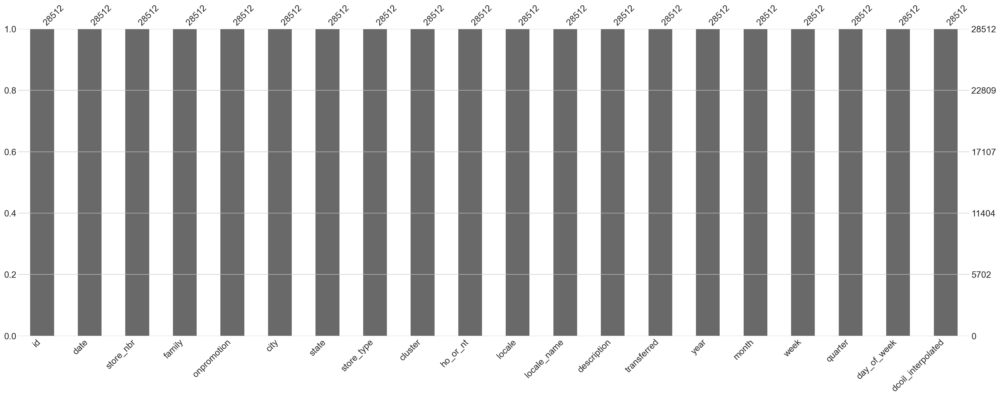

<IPython.core.display.Javascript object>

In [368]:
msno.bar(dt_test.sample(28512))

In [369]:
# Save DataFrame test
dt_test.to_csv("TestFinish.csv", index=False)

<IPython.core.display.Javascript object>

# Let's move on to the exploratory analysis step 

How many cities are represented in the dataset

## Spatial analysis 

In [370]:
df2 = (
    dt_Train.groupby(by=["state", "city"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

In [371]:
# Histogram representing the sale of products from each city by state
fig = px.bar(df2, x="state", y="sales", color="city", text_auto=True)
fig.update_layout(
    autosize=False, width=1000, height=800,
)
fig.show()

<IPython.core.display.Javascript object>

4 states (Pichincha, Guayas, Los rios, Manabi, for which they have several cities) have a higher sales rate than the other states.
 And 2 big cities have a sales rate higher than 500

In [376]:
dfcl = (
    dt_Train.groupby(by=["cluster"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

In [377]:
# Histogram representing the sale by cluster
fig = px.bar(dfcl, x="cluster", y="sales")
fig.update_layout(
    autosize=False, width=1000, height=800,
)
fig.show()

<IPython.core.display.Javascript object>

Cluster n°5 seems to stand out from the other clusters with a sales value above 1000

In [378]:
dfc2 = (
    dt_Train.groupby(by=["state", "cluster"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

# Histogram representing the sale of each cluster by state
fig = px.bar(dfc2, x="state", y="sales", color="cluster", text_auto=True)
fig.update_layout(
    autosize=False, width=1000, height=800,
)
fig.show()

<IPython.core.display.Javascript object>

In [379]:
dfc2 = (
    dt_Train.groupby(by=["city", "cluster"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

# Histogram representing the sale of each cluster by state
fig = px.bar(dfc2, x="city", y="sales", color="cluster", text_auto=True)
fig.update_layout(
    autosize=False, width=1000, height=800,
)
fig.show()

<IPython.core.display.Javascript object>

 Here we observe that clusters are not specifically grouped according to geography

## Types of stores

In [380]:
dt_Train.dtypes

id                             int64
date                  datetime64[ns]
store_nbr                      int64
family                        object
sales                        float64
onpromotion                    int64
city                          object
state                         object
store_type                    object
cluster                        int64
ho_or_nt                      object
locale                        object
locale_name                   object
description                   object
transferred                     bool
year                           int64
month                          int64
week                          UInt32
quarter                        int64
day_of_week                   object
dcoil_interpolated           float64
dtype: object

<IPython.core.display.Javascript object>

In [382]:
df3 = (
    dt_Train.groupby("store_type")
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

In [383]:
fig = px.pie(df3, values="sales", names="store_type", hole=0.5)
fig.update_layout(
    autosize=False, width=1000, height=800,
)
fig.show()

<IPython.core.display.Javascript object>

In [385]:
df4 = (
    dt_Train.groupby(by=["store_type", "family"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

# Histogram representing the sale of each family product by store type
fig = px.bar(df4, x="store_type", y="sales", color="family", text_auto=True)
fig.update_layout(
    autosize=False, width=1000, height=800,
)
fig.show()

<IPython.core.display.Javascript object>

## Sales analysis by product (familly) group

In [386]:
dt_Train["family"].unique().tolist()

['AUTOMOTIVE',
 'BABY CARE',
 'BEAUTY',
 'BEVERAGES',
 'BOOKS',
 'BREAD/BAKERY',
 'CELEBRATION',
 'CLEANING',
 'DAIRY',
 'DELI',
 'EGGS',
 'FROZEN FOODS',
 'GROCERY I',
 'GROCERY II',
 'HARDWARE',
 'HOME AND KITCHEN I',
 'HOME AND KITCHEN II',
 'HOME APPLIANCES',
 'HOME CARE',
 'LADIESWEAR',
 'LAWN AND GARDEN',
 'LINGERIE',
 'LIQUOR,WINE,BEER',
 'MAGAZINES',
 'MEATS',
 'PERSONAL CARE',
 'PET SUPPLIES',
 'PLAYERS AND ELECTRONICS',
 'POULTRY',
 'PREPARED FOODS',
 'PRODUCE',
 'SCHOOL AND OFFICE SUPPLIES',
 'SEAFOOD']

<IPython.core.display.Javascript object>

In [43]:
# There are 33 product groups

<IPython.core.display.Javascript object>

In [388]:
dff = (
    dt_Train.groupby("family")
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

In [389]:
fig = px.bar(dff, x="family", y="sales", text_auto=True)
fig.update_layout(
    autosize=False, width=1000, height=1000,
)
fig.show()

<IPython.core.display.Javascript object>

the group with the highest sales value is Grocery 1

## Event analysis

In [391]:
dff = (
    dt_Train.groupby("ho_or_nt")
    .agg({"sales": "mean"})
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

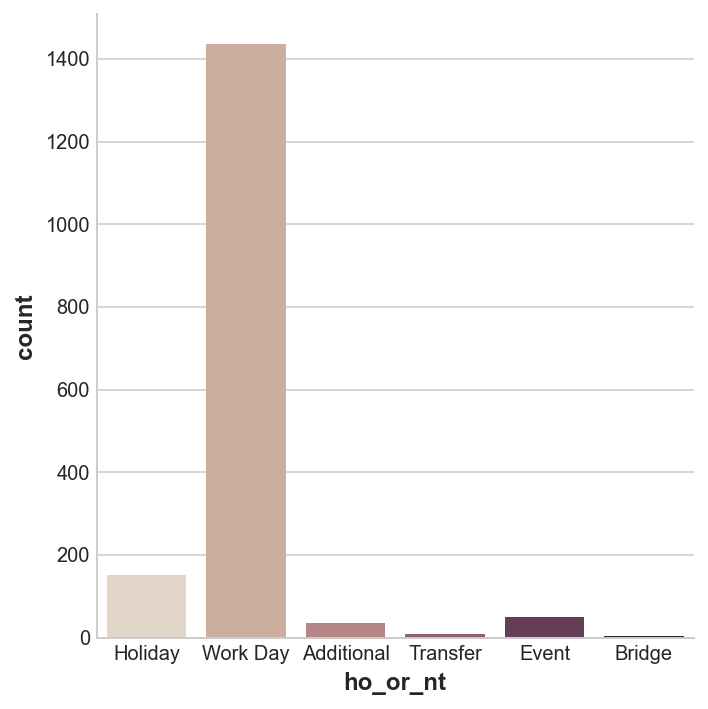

<IPython.core.display.Javascript object>

In [392]:
Eventbyday = dt_Train.drop_duplicates(subset=["date"])
sns.catplot(x="ho_or_nt", kind="count", palette="ch:.25", data=Eventbyday)

Text(0.5, 1.0, 'average holiday sales')

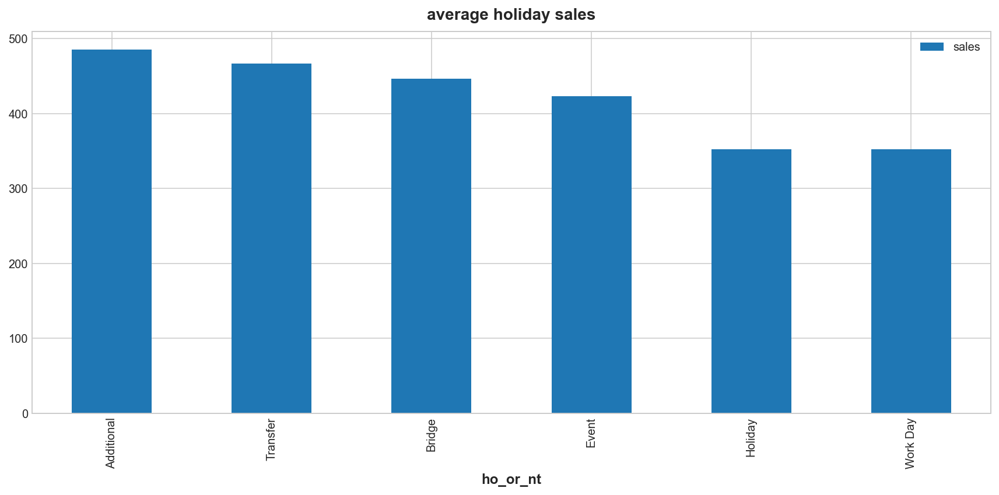

<IPython.core.display.Javascript object>

In [393]:
dff.plot(kind="bar", figsize=(12, 6)).set_title("average holiday sales")

 It seems that during the periods outside of work, there is slight increase in sales 
    Exception for New Year's Day and additional day of holiday (making Christmas Eve a holiday)

## Oil Analysis 

Why the oil ? 
Ecuador is a small "dollarized" economy.
It is relatively open, very dependent on oil revenues (which represent between 14% and 20% of its GDP, more than half of export revenues, and between 20% and 30% of government revenues)


In [395]:
dfoil = (
    dt_Train.groupby(by=["city", "date"])
    .agg({"dcoil_interpolated": "mean"})
    .reset_index()
    .sort_values(by="dcoil_interpolated", ascending=False)
)

<IPython.core.display.Javascript object>

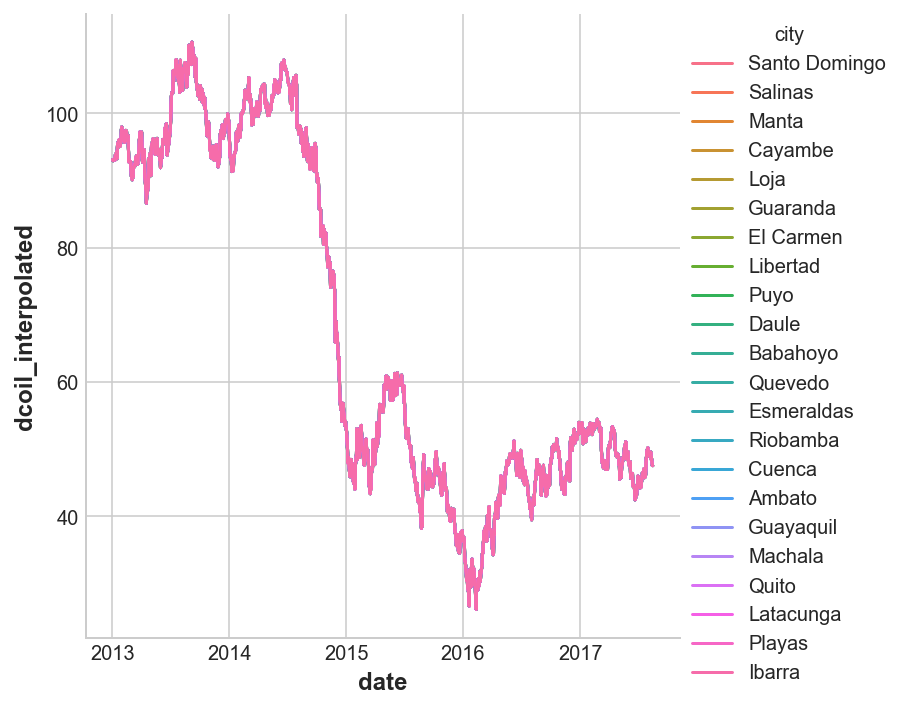

<IPython.core.display.Javascript object>

In [396]:
sns.relplot(
    x="date",
    y="dcoil_interpolated",
    hue="city",
    estimator=None,
    kind="line",
    data=dfoil,
)

There was a sudden drop in oil prices during 2014. The price of gasoline is similar between the different cities.

In [397]:
oil = pd.read_csv(download_dir / "oil.csv", sep=",")

# Interpolate
oil["dcoilwtico"] = np.where(
    oil["dcoilwtico"] == 0, np.nan, oil["dcoilwtico"]
)  # replace 0 with NaN
oil[
    "dcoil_interpolated"
] = oil.dcoilwtico.interpolate()  # fill NaN values using interpolation

oil.head(10)

,date,dcoilwtico,dcoil_interpolated
0,2013-01-01,NaN,NaN
1,2013-01-02,93.14,93.14
2,2013-01-03,92.97,92.97
3,2013-01-04,93.12,93.12
4,2013-01-07,93.20,93.20
5,2013-01-08,93.21,93.21
6,2013-01-09,93.08,93.08
7,2013-01-10,93.81,93.81
8,2013-01-11,93.60,93.60
9,2013-01-14,94.27,94.27


<IPython.core.display.Javascript object>

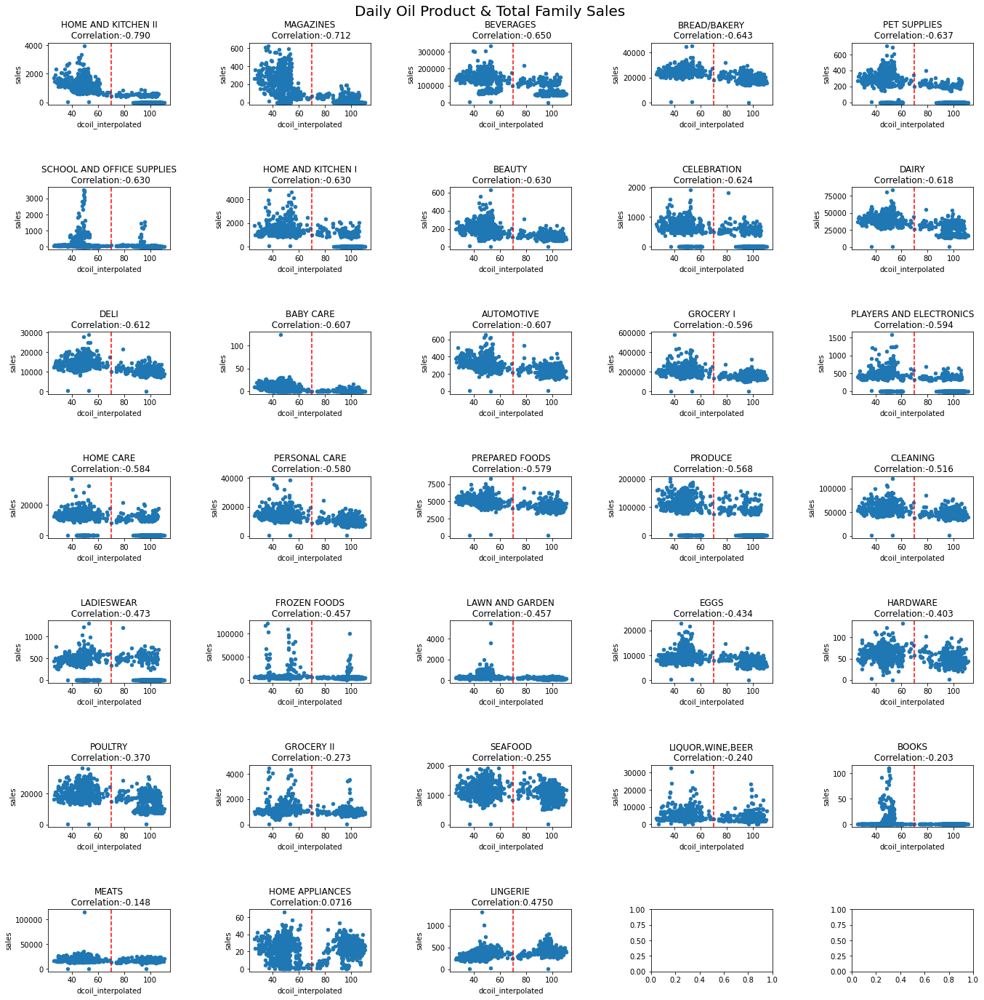

<IPython.core.display.Javascript object>

In [62]:
import matplotlib.pyplot as plt


def plot_sales_and_oil_dependency():
    a = pd.merge(
        train.groupby(["date", "family"]).sales.sum().reset_index(),
        oil.drop("dcoilwtico", axis=1),
        how="left",
    )
    c = a.groupby("family").corr("spearman").reset_index()
    c = c[c.level_1 == "dcoil_interpolated"][["family", "sales"]].sort_values("sales")

    fig, axes = plt.subplots(7, 5, figsize=(20, 20))
    for i, fam in enumerate(c.family):
        a[a.family == fam].plot.scatter(
            x="dcoil_interpolated", y="sales", ax=axes[i // 5, i % 5]
        )
        axes[i // 5, i % 5].set_title(
            fam + "\n Correlation:" + str(c[c.family == fam].sales.iloc[0])[:6],
            fontsize=12,
        )
        axes[i // 5, i % 5].axvline(x=70, color="r", linestyle="--")

    plt.tight_layout(pad=5)
    plt.suptitle("Daily Oil Product & Total Family Sales \n", fontsize=20)
    plt.show()


plot_sales_and_oil_dependency()

 There seems to be a relationship between the different product groups and the oil price
In general, the different product groups have the same character as the oil price 
we observe two subsets with correlations (Spearman) more or less strong depending on the product.
The first subset includes more sales and corresponds to an oil price below 70. And the second group containing less sales corresponding to an oil price above 70.


# Time analysis of product sales 

In [67]:
dffa = (
    dt_Train.groupby(by=["family", "date"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="date", ascending=True)
)

<IPython.core.display.Javascript object>

In [72]:
px.line(
    dffa, x="date", y="sales", color="family", title="Daily total sales of the family"
)

<IPython.core.display.Javascript object>

It can be observed that there are certain product groups that follow a growing trend over the years (like grocery groups or bakery).They also follow daily, weekly and monthly variations and during certain periods of the year (increase in sales during December).
But other products (lingerie, book) do not follow annual, seasonal, monthly or weekly trends.


In [74]:
dffaf = (
    dt_Train.set_index("date")
    .groupby("store_nbr")
    .resample("D")
    .sales.sum()
    .reset_index()
)
px.line(
    dffaf,
    x="date",
    y="sales",
    color="store_nbr",
    title="Daily total sales of the stores",
)

<IPython.core.display.Javascript object>

For the total daily sales of the stores, we observe that the stores follow the same temporal trends but with variations on the quantity of product sold 

I will aggregate the data by stores and families on my sales values. To give an average sales index and facilitate the visualization of the results.

In [76]:
dt_Train.dtypes

id                             int64
date                  datetime64[ns]
store_nbr                      int64
family                        object
sales                        float64
onpromotion                    int64
city                          object
state                         object
store_type                    object
cluster                        int64
ho_or_nt                      object
locale                        object
locale_name                   object
description                   object
transferred                     bool
year                           int64
month                          int64
week                          UInt32
quarter                        int64
day_of_week                   object
dcoil_interpolated           float64
dtype: object

<IPython.core.display.Javascript object>

In [78]:
Av_sale_Ye = (
    dt_Train.groupby("year")
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

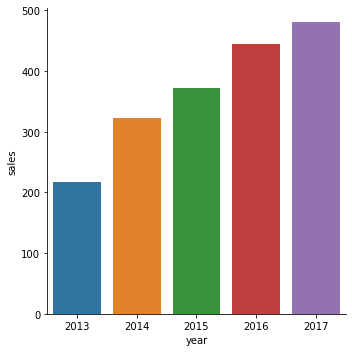

<IPython.core.display.Javascript object>

In [81]:
sns.catplot(x="year", y="sales", data=Av_sale_Ye, kind="bar")

In [83]:
Av_sale_q = (
    dt_Train.groupby("quarter")
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

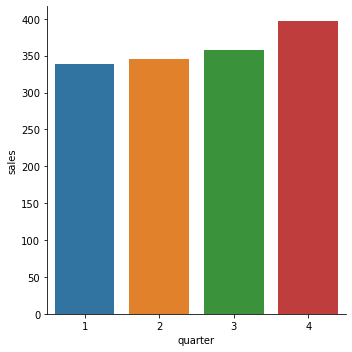

<IPython.core.display.Javascript object>

In [85]:
sns.catplot(x="quarter", y="sales", data=Av_sale_q, kind="bar")

In [87]:
Av_sale_M = (
    dt_Train.groupby("month")
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

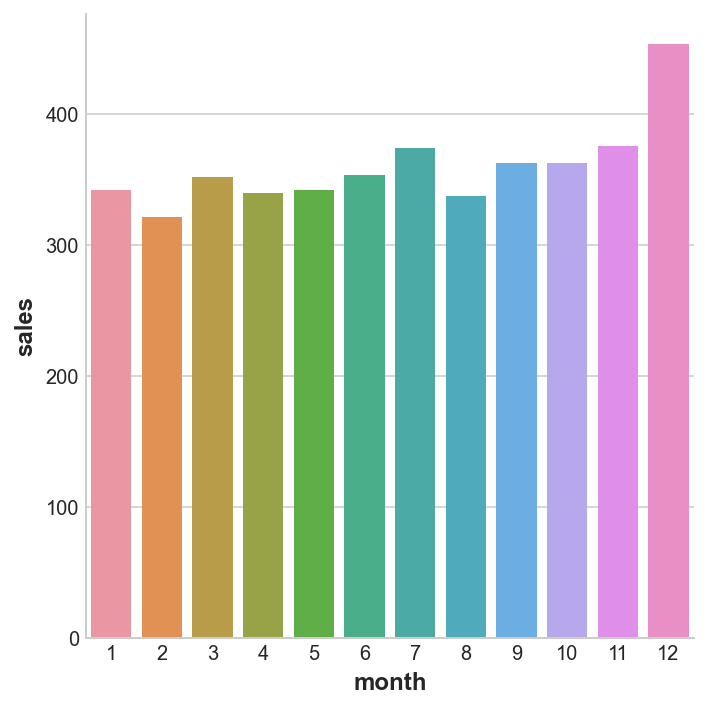

<IPython.core.display.Javascript object>

In [398]:
sns.catplot(x="month", y="sales", data=Av_sale_M, kind="bar")

In [91]:
Av_sale_W = (
    dt_Train.groupby("week")
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

In [92]:
fig = px.bar(Av_sale_W, x="week", y="sales")
fig.show()

<IPython.core.display.Javascript object>

In [94]:
Av_sale_D = (
    dt_Train.groupby("day_of_week")
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="sales", ascending=False)
)

<IPython.core.display.Javascript object>

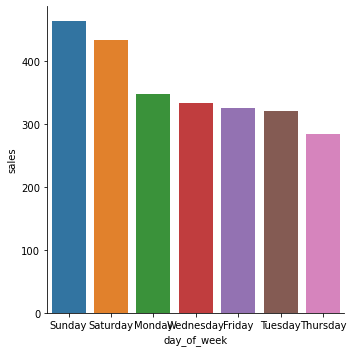

<IPython.core.display.Javascript object>

In [96]:
sns.catplot(x="day_of_week", y="sales", data=Av_sale_D, kind="bar")

On this dataset, the average sales per product and per shop follow a trend over the years (increase in sales rates per year), a quarterly variability marked by certain periods of the year which will increase the purchase rate, a variability at the beginning and end of the month where sales increase (buyers' income at the end of the month) and a daily variability where on Saturdays and Sundays, there is an overall increase in sales over the week. 



# Let's move on to the modeling stage 

Before predicting the test values, we will build several models to improve the accuracy of the model. The metric used will be the RMSE 

Why RMSE ?

It is often used to predict time series and has many advantages. It is robust to outliers (we have not treated outliers). It calculates the relative error between the predicted and actual values and penalises underestimation of the actual value more severely than overestimation. In general, unlike RMSE (Root Mean Squared Error), it performs well with labels that can take on values over several orders of magnitude.

We can see document of RMSE:
https://www.kaggle.com/general/215997 of Satish Gunjal
Or Very good Notebook on Model Fit Metrics 
https://www.kaggle.com/code/residentmario/model-fit-metrics/notebook of Aleksey Bilogur




We will use the functions of the course (Kaggle Time Series) to build our model 

In [399]:
simplefilter("ignore")  # ignore warnings to clean up output cells

# Set Matplotlib defaults
plt.style.use("seaborn-whitegrid")
plt.rc("figure", autolayout=True, figsize=(11, 5))
plt.rc(
    "axes",
    labelweight="bold",
    labelsize="large",
    titleweight="bold",
    titlesize=14,
    titlepad=10,
)
plot_params = dict(
    color="0.75",
    style=".-",
    markeredgecolor="0.25",
    markerfacecolor="0.25",
    legend=False,
)
%config InlineBackend.figure_format = 'retina'

<IPython.core.display.Javascript object>

In [414]:
def fourier_features(index, freq, order):
    time = np.arange(len(index), dtype=np.float32)
    k = 2 * np.pi * (1 / freq) * time
    features = {}
    for i in range(1, order + 1):
        features.update(
            {f"sin_{freq}_{i}": np.sin(i * k), f"cos_{freq}_{i}": np.cos(i * k)}
        )
    return pd.DataFrame(features, index=index)


# Compute Fourier features to the 4th order (8 new features) for a
# series y with daily observations and annual seasonality:
#
# fourier_features(y, freq=365.25, order=4)

# annotations: https://stackoverflow.com/a/49238256/5769929
def seasonal_plot(X, y, period, freq, ax=None):
    if ax is None:
        _, ax = plt.subplots()
    palette = sns.color_palette("husl", n_colors=X[period].nunique())
    ax = sns.lineplot(
        x=freq, y=y, hue=period, data=X, ci=False, ax=ax, palette=palette, legend=False,
    )
    ax.set_title(f"Seasonal Plot ({period}/{freq})")
    for line, name in zip(ax.lines, X[period].unique()):
        y_ = line.get_ydata()[-1]
        ax.annotate(
            name,
            xy=(1, y_),
            xytext=(6, 0),
            color=line.get_color(),
            xycoords=ax.get_yaxis_transform(),
            textcoords="offset points",
            size=14,
            va="center",
        )
    return ax


def plot_periodogram(ts, detrend="linear", ax=None):
    from scipy.signal import periodogram

    fs = pd.Timedelta("1Y") / pd.Timedelta("1D")
    freqencies, spectrum = periodogram(
        ts, fs=fs, detrend=detrend, window="boxcar", scaling="spectrum",
    )
    if ax is None:
        _, ax = plt.subplots()
    ax.step(freqencies, spectrum, color="purple")
    ax.set_xscale("log")
    ax.set_xticks([1, 2, 4, 6, 12, 26, 52, 104])
    ax.set_xticklabels(
        [
            "Annual (1)",
            "Semiannual (2)",
            "Quarterly (4)",
            "Bimonthly (6)",
            "Monthly (12)",
            "Biweekly (26)",
            "Weekly (52)",
            "Semiweekly (104)",
        ],
        rotation=30,
    )
    ax.ticklabel_format(axis="y", style="sci", scilimits=(0, 0))
    ax.set_ylabel("Variance")
    ax.set_title("Periodogram")
    return ax

<IPython.core.display.Javascript object>

To build our model we will only use the year 2017.
Because we will predict that 15 days of data following the Train set 

For our model, we will apply a foursquare feature to capture the overall shape of the curves 
seasonal, quarterly, monthly and daily.

In [415]:
Average_sales = (
    dt_Train.groupby(by=["date"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="date", ascending=True)
)

<IPython.core.display.Javascript object>

In [416]:
family_sales = (
    dt_Train.groupby(by=["family", "date"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="date", ascending=True)
)

<IPython.core.display.Javascript object>

In [417]:
family_sales2 = (
    family_sales.groupby(["family", "date"])
    .mean()
    .unstack("family")
    .loc["2017", ["sales"]]
)

<IPython.core.display.Javascript object>

In [418]:
food_sales1 = family_sales2.sales["GROCERY I"]

<IPython.core.display.Javascript object>

How many Fourier pairs should we actually include in our feature set? We can answer this question with the periodogram. The periodogram tells you the strength of the frequencies in a time series.

<AxesSubplot:title={'center':'Periodogram'}, ylabel='Variance'>

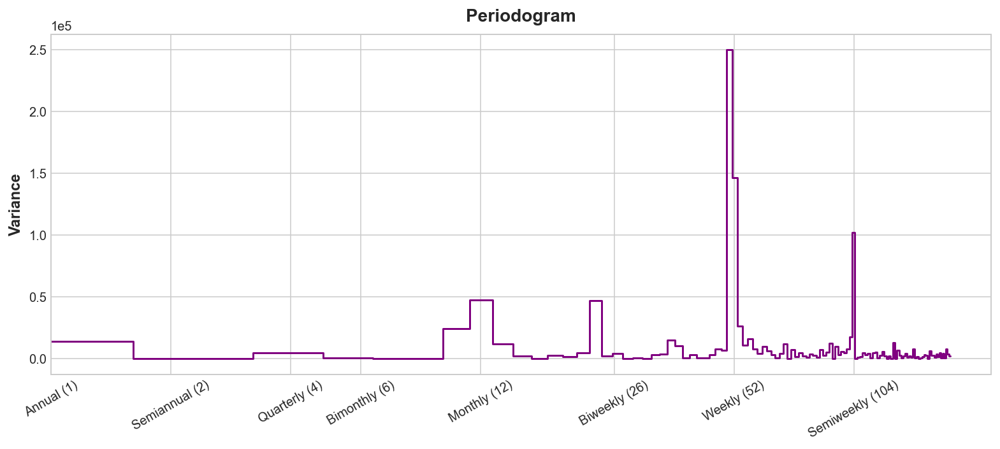

<IPython.core.display.Javascript object>

In [419]:
plot_periodogram(food_sales1)

The periodogram agrees with the seasonal plots above: a strong weekly season and a weaker mensual season. The weekly season we'll model with indicators and the annual season with Fourier features. 
The periodogram indicates that we should take a value Weekly. 
We'll create our seasonal features using DeterministicProcess

In [420]:
dt_Train["store_nbr"] = pd.Categorical(dt_Train["store_nbr"])
dt_Train["day_of_week"] = pd.Categorical(dt_Train["day_of_week"])
dt_Train["city"] = pd.Categorical(dt_Train["city"])
dt_Train["cluster"] = pd.Categorical(dt_Train["cluster"])
dt_Train["store_type"] = pd.Categorical(dt_Train["store_type"])
dt_Train["state"] = pd.Categorical(dt_Train["state"])
dt_Train["city"] = pd.Categorical(dt_Train["city"])
dt_Train["family"] = pd.Categorical(dt_Train["family"])
dt_Train["ho_or_nt"] = pd.Categorical(dt_Train["ho_or_nt"])
dt_Train["description"] = pd.Categorical(dt_Train["description"])

<IPython.core.display.Javascript object>

In [421]:
# Save Data train
dt_Train.to_csv("TrainFinish.csv", index=False)

<IPython.core.display.Javascript object>

In [ ]:
# First simple Build Model

In [123]:
download_dir2 = Path(r"C:\Users\JbPer\Openclassroom\Projet 8")

<IPython.core.display.Javascript object>

In [128]:
store_sales = pd.read_csv(
    download_dir2 / "TrainFinish.csv",
    usecols=["store_nbr", "family", "date", "sales"],
    dtype={"store_nbr": "float32", "family": "category", "sales": "float32"},
    parse_dates=["date"],
    infer_datetime_format=True,
)

store_sales = store_sales.dropna(subset=["sales"])

store_sales["store_nbr"] = store_sales[
    "store_nbr"].astype(float).astype(int)

store_sales["store_nbr"] = pd.Categorical(store_sales["store_nbr"])

store_sales["date"] = store_sales.date.dt.to_period("D")

store_sales = store_sales.set_index([
    "store_nbr", "family", "date"]).sort_index()

average_sales = store_sales.groupby("date").mean().squeeze().loc["2017"]

<IPython.core.display.Javascript object>

In [129]:
store_sales

sales
store_nbr family     date             
1         AUTOMOTIVE 2013-01-01    0.0
                     2013-01-02    2.0
                     2013-01-03    3.0
                     2013-01-04    3.0
                     2013-01-05    5.0
...                                ...
54        SEAFOOD    2017-08-11    0.0
                     2017-08-12    1.0
                     2017-08-13    2.0
                     2017-08-14    0.0
                     2017-08-15    3.0

[3000888 rows x 1 columns]

<IPython.core.display.Javascript object>

In [130]:
y = store_sales.unstack(["store_nbr", "family"]).loc["2017"]

<IPython.core.display.Javascript object>

In [132]:
# Create training data

fourier = CalendarFourier(freq="W", order=4)
dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    seasonal=False,
    additional_terms=[fourier],
    drop=True,
)
X = dp.in_sample()

<IPython.core.display.Javascript object>

In [133]:
X

,const,trend,"sin(1,freq=W-SUN)","cos(1,freq=W-SUN)","sin(2,freq=W-SUN)","cos(2,freq=W-SUN)","cos(3,freq=W-SUN)","sin(4,freq=W-SUN)"
date,,,,,,,,
2017-01-01,1.0,1.0,-0.781831,0.623490,-0.974928,-0.222521,-0.900969,0.433884
2017-01-02,1.0,2.0,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000
2017-01-03,1.0,3.0,0.781831,0.623490,0.974928,-0.222521,-0.900969,-0.433884
2017-01-04,1.0,4.0,0.974928,-0.222521,-0.433884,-0.900969,0.623490,0.781831
2017-01-05,1.0,5.0,0.433884,-0.900969,-0.781831,0.623490,-0.222521,-0.974928
...,...,...,...,...,...,...,...,...
2017-08-11,1.0,223.0,-0.433884,-0.900969,0.781831,0.623490,-0.222521,0.974928
2017-08-12,1.0,224.0,-0.974928,-0.222521,0.433884,-0.900969,0.623490,-0.781831
2017-08-13,1.0,225.0,-0.781831,0.623490,-0.974928,-0.222521,-0.900969,0.433884


<IPython.core.display.Javascript object>

In [137]:
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.3, random_state=1, shuffle=False
)

model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

LinearRegression(fit_intercept=False)

<IPython.core.display.Javascript object>

In [145]:
y_fit = pd.DataFrame(
    model.predict(X_train), index=X_train.index, columns=y_train.columns
).clip(0.0)

y_pred = pd.DataFrame(
    model.predict(X_val), index=X_val.index, columns=y_val.columns
).clip(0.0)

<IPython.core.display.Javascript object>

In [146]:
from sklearn.metrics import mean_squared_log_error

<IPython.core.display.Javascript object>

In [147]:
rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_valid = mean_squared_log_error(y_val, y_pred) ** 0.5
print(f"Training RMSLE: {rmsle_train:.5f}")
print(f"Validation RMSLE: {rmsle_valid:.5f}")

<IPython.core.display.Javascript object>

Why RMSLE ?
the RMSLE is robust to outliers(We did not treat the Outliers). 
It calculates the relative error between predicted and actual values, and penalizes underestimation of the actual value more severely than overestimation.

In [148]:
y.columns[0:34]

MultiIndex([('sales', 1,                 'AUTOMOTIVE'),
            ('sales', 1,                  'BABY CARE'),
            ('sales', 1,                     'BEAUTY'),
            ('sales', 1,                  'BEVERAGES'),
            ('sales', 1,                      'BOOKS'),
            ('sales', 1,               'BREAD/BAKERY'),
            ('sales', 1,                'CELEBRATION'),
            ('sales', 1,                   'CLEANING'),
            ('sales', 1,                      'DAIRY'),
            ('sales', 1,                       'DELI'),
            ('sales', 1,                       'EGGS'),
            ('sales', 1,               'FROZEN FOODS'),
            ('sales', 1,                  'GROCERY I'),
            ('sales', 1,                 'GROCERY II'),
            ('sales', 1,                   'HARDWARE'),
            ('sales', 1,         'HOME AND KITCHEN I'),
            ('sales', 1,        'HOME AND KITCHEN II'),
            ('sales', 1,            'HOME APPLIA

<IPython.core.display.Javascript object>

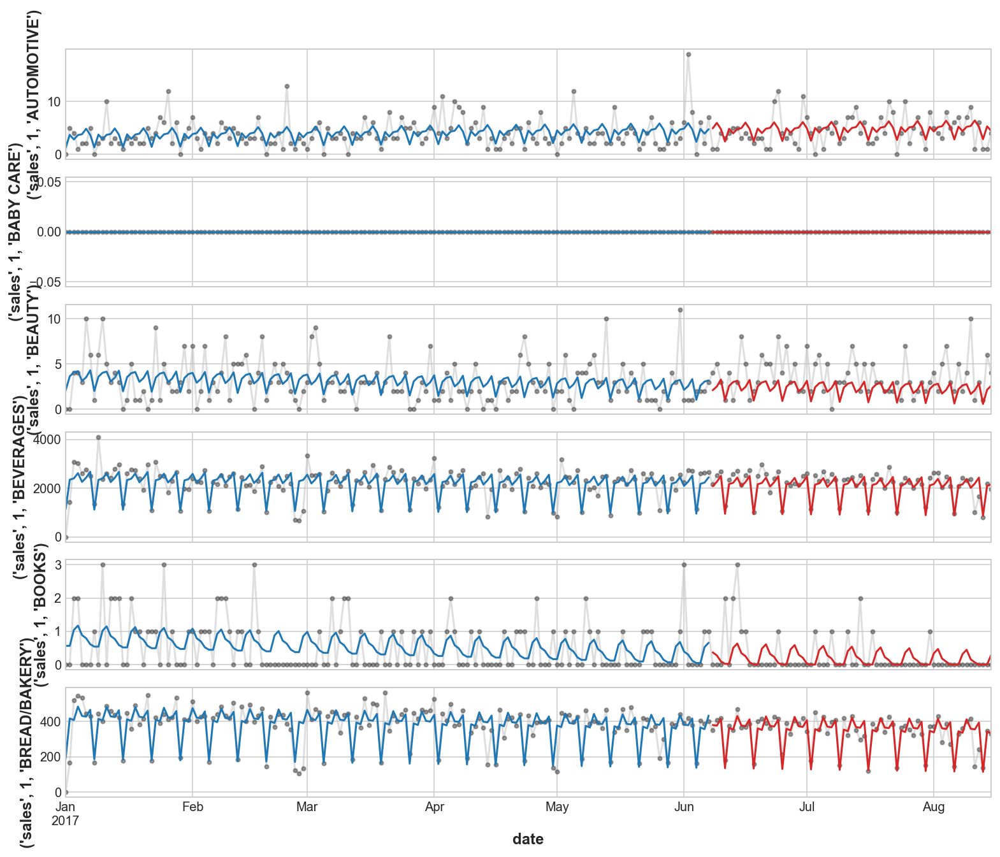

<IPython.core.display.Javascript object>

In [154]:
families = y.columns[0:6]
axs = y.loc(axis=1)[families].plot(
    subplots=True,
    sharex=True,
    figsize=(11, 9),
    **plot_params, alpha=0.5
)

_ = y_fit.loc(axis=1)[families].plot(
    subplots=True,
    sharex=True,
    color="C0",
    ax=axs)

_ = y_pred.loc(axis=1)[families].plot(
    subplots=True,
    sharex=True,
    color="C3",
    ax=axs)

for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

We can do better by adding several variables 

In [155]:
# Create training data
fourier = CalendarFourier(freq="W", order=4)
dp = DeterministicProcess(
    index=y.index,
    constant=True,
    order=1,
    seasonal=False,
    additional_terms=[fourier],
    drop=True,
)
X = dp.in_sample()
X["NewYear"] = X.index.dayofyear == 1

<IPython.core.display.Javascript object>

In [156]:
X

,const,trend,"sin(1,freq=W-SUN)","cos(1,freq=W-SUN)","sin(2,freq=W-SUN)","cos(2,freq=W-SUN)","cos(3,freq=W-SUN)","sin(4,freq=W-SUN)",NewYear
date,,,,,,,,,
2017-01-01,1.0,1.0,-0.781831,0.623490,-0.974928,-0.222521,-0.900969,0.433884,True
2017-01-02,1.0,2.0,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,False
2017-01-03,1.0,3.0,0.781831,0.623490,0.974928,-0.222521,-0.900969,-0.433884,False
2017-01-04,1.0,4.0,0.974928,-0.222521,-0.433884,-0.900969,0.623490,0.781831,False
2017-01-05,1.0,5.0,0.433884,-0.900969,-0.781831,0.623490,-0.222521,-0.974928,False
...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,223.0,-0.433884,-0.900969,0.781831,0.623490,-0.222521,0.974928,False
2017-08-12,1.0,224.0,-0.974928,-0.222521,0.433884,-0.900969,0.623490,-0.781831,False
2017-08-13,1.0,225.0,-0.781831,0.623490,-0.974928,-0.222521,-0.900969,0.433884,False


<IPython.core.display.Javascript object>

# I will select the variables useful for this study 

In [163]:
store_sales1 = pd.read_csv(
    download_dir2 / "TrainFinish.csv",
    usecols=[
        "store_nbr",
        "family",
        "date",
        "day_of_week",
        "city",
        "ho_or_nt",
        "description",
        "dcoil_interpolated",
        "year",
        "month",
        "week",
        "quarter",
        "sales",
    ],
    dtype={
        "store_nbr": "float32",
        "family": "category",
        "sales": "float32",
        "day_of_week": "category",
        "city": "category",
        "ho_or_nt": "category",
        "description": "category",
    },
    parse_dates=["date"],
    infer_datetime_format=True,
)
store_sales1 = store_sales1.dropna(subset=["sales"])
store_sales1["store_nbr"] = store_sales1["store_nbr"].astype(float).astype(int)
store_sales1["store_nbr"] = pd.Categorical(store_sales1["store_nbr"])

store_sales1["date"] = store_sales1.date.dt.to_period("D")

store_sales1 = store_sales1.set_index(["store_nbr",
                                       "family", "date"]).sort_index()

<IPython.core.display.Javascript object>

In [161]:
s = store_sales1.reset_index()
s = s.loc[(s["date"] >= "2017-01-01")]
s.drop(
    ["store_nbr", "family", "sales", "city", "description", "year"],
    axis=1,
    inplace=True,
)
s = s.drop_duplicates(subset=["date"])

<IPython.core.display.Javascript object>

In [164]:
s

,date,ho_or_nt,month,week,quarter,day_of_week,dcoil_interpolated
1457,2017-01-01,Holiday,1,52,1,Sunday,53.055000
1458,2017-01-02,Transfer,1,1,1,Monday,52.707500
1459,2017-01-03,Work Day,1,1,1,Tuesday,52.360000
1460,2017-01-04,Work Day,1,1,1,Wednesday,53.260000
1461,2017-01-05,Work Day,1,1,1,Thursday,53.770000
...,...,...,...,...,...,...,...
1679,2017-08-11,Transfer,8,32,3,Friday,48.810000
1680,2017-08-12,Work Day,8,32,3,Saturday,48.403333
1681,2017-08-13,Work Day,8,32,3,Sunday,47.996667
1682,2017-08-14,Work Day,8,33,3,Monday,47.590000


<IPython.core.display.Javascript object>

In [174]:
transformer = make_column_transformer(
    (OneHotEncoder(sparse=False), ["ho_or_nt", "day_of_week"]), remainder="passthrough",
)

<IPython.core.display.Javascript object>

In [175]:
transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('onehotencoder', OneHotEncoder(sparse=False),
                                 ['ho_or_nt', 'day_of_week'])])

<IPython.core.display.Javascript object>

In [176]:
transformed = transformer.fit_transform(s)
transformed_df = pd.DataFrame(transformed,
                              columns=transformer.get_feature_names())

<IPython.core.display.Javascript object>

In [177]:
transformed_df

,onehotencoder__x0_Additional,onehotencoder__x0_Event,onehotencoder__x0_Holiday,onehotencoder__x0_Transfer,onehotencoder__x0_Work Day,onehotencoder__x1_Friday,onehotencoder__x1_Monday,onehotencoder__x1_Saturday,onehotencoder__x1_Sunday,onehotencoder__x1_Thursday,onehotencoder__x1_Tuesday,onehotencoder__x1_Wednesday,date,month,week,quarter,dcoil_interpolated
0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2017-01-01,1,52,1,53.055
1,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2017-01-02,1,1,1,52.7075
2,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2017-01-03,1,1,1,52.36
3,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2017-01-04,1,1,1,53.26
4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,2017-01-05,1,1,1,53.77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2017-08-11,8,32,3,48.81
223,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2017-08-12,8,32,3,48.403333
224,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2017-08-13,8,32,3,47.996667
225,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2017-08-14,8,33,3,47.59


<IPython.core.display.Javascript object>

In [178]:
transformed_df.dtypes

onehotencoder__x0_Additional       object
onehotencoder__x0_Event            object
onehotencoder__x0_Holiday          object
onehotencoder__x0_Transfer         object
onehotencoder__x0_Work Day         object
onehotencoder__x1_Friday           object
onehotencoder__x1_Monday           object
onehotencoder__x1_Saturday         object
onehotencoder__x1_Sunday           object
onehotencoder__x1_Thursday         object
onehotencoder__x1_Tuesday          object
onehotencoder__x1_Wednesday        object
date                            period[D]
month                              object
week                               object
quarter                            object
dcoil_interpolated                 object
dtype: object

<IPython.core.display.Javascript object>

I have to set my variables to float 

In [180]:
X_variable = transformed_df.set_index(["date"])
X_variable = X_variable.astype(float)

<IPython.core.display.Javascript object>

And I merge my data array with the variable X (created by DeterministicProcess)

In [182]:
X2 = X.merge(X_variable, how="left", on="date")

<IPython.core.display.Javascript object>

In [184]:
X_train, X_val, y_train, y_val = train_test_split(
    X2, y, test_size=0.3, random_state=1, shuffle=False
)

model = LinearRegression(fit_intercept=False)
model.fit(X_train, y_train)

LinearRegression(fit_intercept=False)

<IPython.core.display.Javascript object>

In [186]:
y_fit = pd.DataFrame(
    model.predict(X_train), index=X_train.index, columns=y_train.columns
).clip(0.0)

y_pred = pd.DataFrame(
    model.predict(X_val), index=X_val.index, columns=y_val.columns
).clip(0.0)

<IPython.core.display.Javascript object>

In [187]:
rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_valid = mean_squared_log_error(y_val, y_pred) ** 0.5
print(f"Training RMSLE: {rmsle_train:.5f}")
print(f"Validation RMSLE: {rmsle_valid:.5f}")

<IPython.core.display.Javascript object>

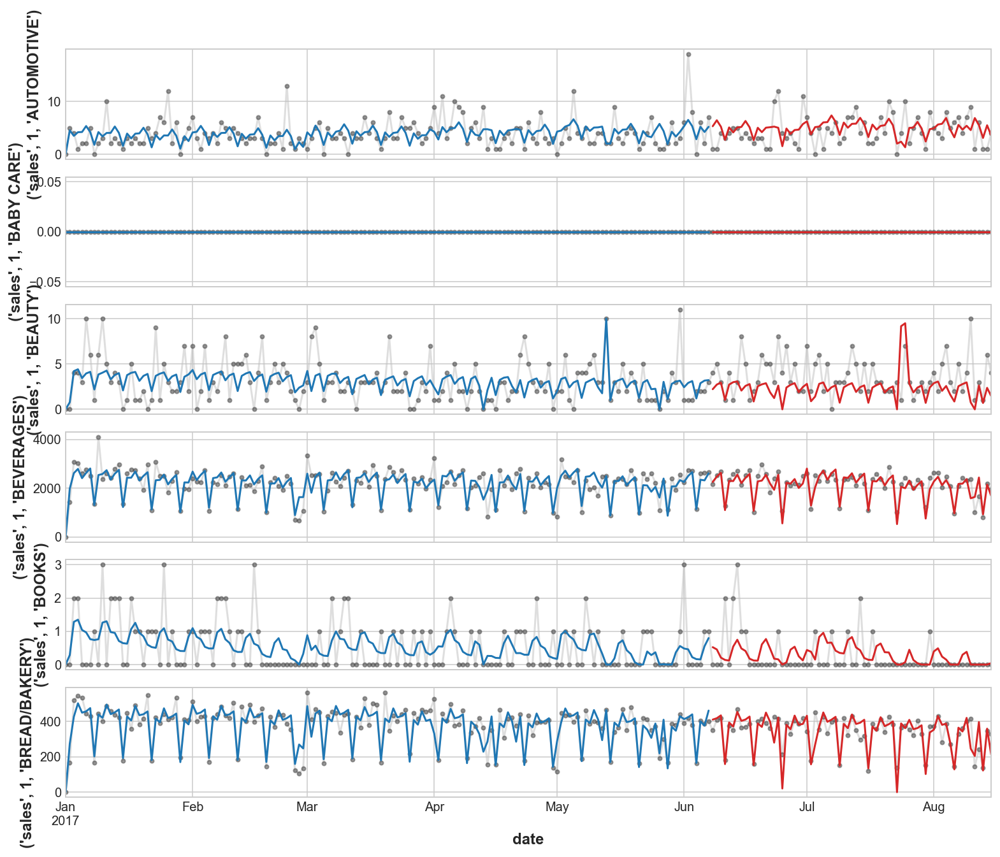

<IPython.core.display.Javascript object>

In [189]:
families = y.columns[0:6]
axs = y.loc(axis=1)[families].plot(
    subplots=True,
    sharex=True,
    figsize=(11, 9),
    **plot_params, alpha=0.5)

_ = y_fit.loc(axis=1)[families].plot(subplots=True,
                                     sharex=True,
                                     color="C0",
                                     ax=axs)

_ = y_pred.loc(axis=1)[families].plot(subplots=True,
                                      sharex=True,
                                      color="C3",
                                      ax=axs)
for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

The results of the validation seem less good but more robust 

### We will try another regression model

In [192]:
X_train, X_val, y_train, y_val = train_test_split(
    X2, y, test_size=0.3, random_state=1, shuffle=False
)

<IPython.core.display.Javascript object>

In [198]:
param_grid = {"ridge__alpha": [0.01, 0.1, 1, 10, 20, 100, 200]}
pipe = make_pipeline(RobustScaler(), Ridge())

# Dont use RMSLE, problem that needs to be solved ,

grid = GridSearchCV(pipe, param_grid, scoring="neg_mean_absolute_error", cv=5)

<IPython.core.display.Javascript object>

In [199]:
grid.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('robustscaler', RobustScaler()),
                                       ('ridge', Ridge())]),
             param_grid={'ridge__alpha': [0.01, 0.1, 1, 10, 20, 100, 200]},
             scoring='neg_mean_absolute_error')

<IPython.core.display.Javascript object>

In [201]:
print("Training-set Score : {:.2f}".format(grid.score(X_train, y_train)))
print(" Test-set Score : {:.2f}".format(grid.score(X_val, y_val)))
print("MAE : {:.2f}".format(grid.best_score_))
print("Best parameters: {}".format(grid.best_params_))
y_pred = grid.predict(X_val).clip(0.0)
print("mean_squared_log_error: %.2f" % mean_squared_log_error(y_val, y_pred))

# calculate the RMSLE on the test set

rmsle = np.sqrt(metrics.mean_squared_log_error(y_val, y_pred))
print("rmsle: {:.2f}".format(rmsle))

<IPython.core.display.Javascript object>

R2 compares the fit of the chosen model with that of a horizontal straight line (the null hypothesis). If the chosen model fits worse than a horizontal line, then R2 is negative. Note that R2 is not always the square of anything, so it can have a negative value without violating any rules of math. R2

is negative only when the chosen model does not follow the trend of the data, so fits worse than a horizontal line.

In [203]:
y_fit = pd.DataFrame(
    grid.predict(X_train), index=X_train.index, columns=y_train.columns
).clip(0.0)
y_pred = pd.DataFrame(
    grid.predict(X_val), index=X_val.index, columns=y_val.columns
).clip(0.0)

<IPython.core.display.Javascript object>

In [204]:
rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
rmsle_valid = mean_squared_log_error(y_val, y_pred) ** 0.5
print(f"Training RMSLE: {rmsle_train:.5f}")
print(f"Validation RMSLE: {rmsle_valid:.5f}")

<IPython.core.display.Javascript object>

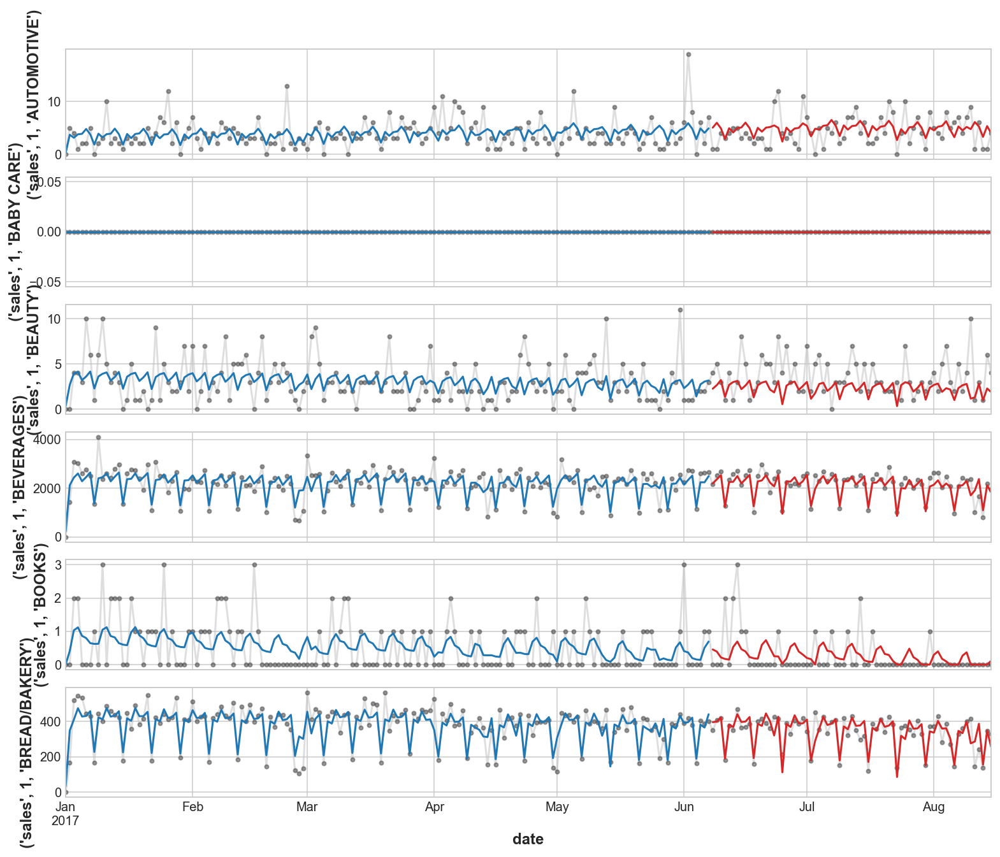

<IPython.core.display.Javascript object>

In [210]:
families = y.columns[0:6]
axs = y.loc(axis=1)[families].plot(
    subplots=True, sharex=True, figsize=(11, 9), **plot_params, alpha=0.5,
)
_ = y_fit.loc(axis=1)[families].plot(subplots=True,
                                     sharex=True, color="C0", ax=axs)
_ = y_pred.loc(axis=1)[families].plot(subplots=True,
                                      sharex=True, color="C3", ax=axs)

for ax, family in zip(axs, families):
    ax.legend([])
    ax.set_ylabel(family)

The result seems almost identical to the previous one 

however, we did not use the variable Onpromotion which is correlated to the target variable.

In [212]:
stores.index

RangeIndex(start=0, stop=54, step=1)

<IPython.core.display.Javascript object>

Let's change slightly the structure of the dataset. We will use a loop for each store, 54 stores.

In [227]:
stores = pd.read_csv(download_dir / "stores.csv", sep=",")

<IPython.core.display.Javascript object>

In [220]:
dt_Train = pd.read_csv(
    download_dir2 / "TrainFinish.csv",
    usecols=[
        "store_nbr",
        "family",
        "date",
        "onpromotion",
        "sales",
        "dcoil_interpolated",
        "city",
    ],
    dtype={"family": "object",
           "onpromotion": "int32",
           "store_nbr": "category"},
    parse_dates=["date"],
    infer_datetime_format=True,
)

<IPython.core.display.Javascript object>

In [221]:
dt_Train["date"] = dt_Train.date.dt.to_period("D")

<IPython.core.display.Javascript object>

In [222]:
dt_Train["store_nbr"] = pd.Categorical(dt_Train["store_nbr"])

<IPython.core.display.Javascript object>

In [223]:
dt_Train

,date,store_nbr,family,sales,onpromotion,city,dcoil_interpolated
0,2013-01-01,1,AUTOMOTIVE,0.000,0,Quito,NaN
1,2013-01-01,1,BABY CARE,0.000,0,Quito,NaN
2,2013-01-01,1,BEAUTY,0.000,0,Quito,NaN
3,2013-01-01,1,BEVERAGES,0.000,0,Quito,NaN
4,2013-01-01,1,BOOKS,0.000,0,Quito,NaN
...,...,...,...,...,...,...,...
3000883,2017-08-15,9,POULTRY,438.133,0,Quito,47.57
3000884,2017-08-15,9,PREPARED FOODS,154.553,1,Quito,47.57
3000885,2017-08-15,9,PRODUCE,2419.729,148,Quito,47.57
3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,Quito,47.57


<IPython.core.display.Javascript object>

In [228]:
stores = stores.set_index(["store_nbr"]).sort_index()

<IPython.core.display.Javascript object>

In [231]:
train_rdy = dt_Train.set_index(["store_nbr", "family", "date"]).sort_index()
train_rdy = train_rdy.dropna(subset=["sales"])
display(train_rdy)

sales  onpromotion   city  \
store_nbr family     date                                        
1         AUTOMOTIVE 2013-01-01   0.000000            0  Quito   
                     2013-01-02   2.000000            0  Quito   
                     2013-01-03   3.000000            0  Quito   
                     2013-01-04   3.000000            0  Quito   
                     2013-01-05   5.000000            0  Quito   
...                                    ...          ...    ...   
9         SEAFOOD    2017-08-11  23.831000            0  Quito   
                     2017-08-12  16.859001            4  Quito   
                     2017-08-13  20.000000            0  Quito   
                     2017-08-14  17.000000            0  Quito   
                     2017-08-15  16.000000            0  Quito   

                                 dcoil_interpolated  
store_nbr family     date                            
1         AUTOMOTIVE 2013-01-01                 NaN  
                     2013-01-02           93.140000  
                     2013-01-03           92.970000  
                     2013-01-04           93.120000  
                     2013-01-05           93.146667  
...                                             ...  
9         SEAFOOD    2017-08-11           48.810000  
                     2017-08-12           48.403333  
                     2017-08-13           47.996667  
                     2017-08-14           47.590000  
                     2017-08-15           47.570000  

[3000888 rows x 4 columns]

<IPython.core.display.Javascript object>

In [232]:
stores.index

Int64Index([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
            18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
            35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
            52, 53, 54],
           dtype='int64', name='store_nbr')

<IPython.core.display.Javascript object>

In [234]:
sdate = "2017-01-01"  # start and end of training date
edate = "2017-08-15"
y_arr = []
onpromotion_arr = []

for nbr in stores.index:
    # y_arr
    temp = train_rdy.loc[str(nbr), "sales"]
    y_arr.append(temp.unstack(["family"]).loc[sdate:edate])

    # onpromotion_arr
    onpromotion = train_rdy.loc[str(nbr), "onpromotion"]
    onpromotion = onpromotion.unstack(["family"]).loc[sdate:edate].sum(axis=1)
    onpromotion.name = "onpromotion"
    onpromotion_arr.append(onpromotion)

y_arr[0]  # sales of store_nbr 2

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.000,...,0.0,0.00000,0.0,0.0,0.0,0.000,0.000000,0.0000,0.0,0.000
2017-01-02,5.0,0.0,0.0,1434.0,0.0,166.81900,0.0,332.0,376.0,44.980,...,1.0,116.72400,81.0,5.0,4.0,140.379,59.363000,1319.8829,0.0,12.728
2017-01-03,4.0,0.0,4.0,3081.0,2.0,519.34800,15.0,952.0,1045.0,209.300,...,1.0,344.58300,258.0,10.0,9.0,408.047,108.369000,3558.4360,0.0,30.082
2017-01-04,1.0,0.0,4.0,3039.0,2.0,543.25100,17.0,1055.0,1029.0,135.944,...,6.0,326.20300,243.0,6.0,8.0,495.952,74.846000,4830.2700,1.0,39.352
2017-01-05,2.0,0.0,3.0,2617.0,0.0,533.48000,40.0,918.0,853.0,137.006,...,6.0,274.20500,188.0,8.0,11.0,329.311,112.270004,2896.1720,1.0,25.228
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,0.0,1.0,1006.0,0.0,145.60700,4.0,341.0,343.0,64.302,...,4.0,385.99402,53.0,5.0,3.0,259.118,24.963001,1115.3340,0.0,19.424
2017-08-12,6.0,0.0,3.0,1659.0,0.0,243.22000,3.0,351.0,526.0,99.488,...,6.0,211.75600,227.0,3.0,6.0,217.664,48.058000,1762.4930,0.0,20.150
2017-08-13,1.0,0.0,1.0,803.0,0.0,136.67900,1.0,169.0,266.0,47.770,...,4.0,88.18200,45.0,2.0,0.0,115.758,20.346000,986.6690,0.0,11.378


<IPython.core.display.Javascript object>

In [237]:
fourier = CalendarFourier(freq="W", order=4)
X_arr = []
X_test_r = []
store_index = 1

for y, onpromotion in zip(y_arr, onpromotion_arr):
    dp = DeterministicProcess(
        index=y.index,
        constant=True,
        order=1,
        seasonal=False,
        additional_terms=[fourier],
        drop=True,
    )

    X = dp.in_sample()
    X = X.merge(onpromotion, how="left", left_index=True, right_index=True)
    X = X.merge(X_variable, how="left", on="date")

    store_state = stores.loc[store_index, "state"]
    store_city = stores.loc[store_index, "city"]

    X_arr.append(X)

<IPython.core.display.Javascript object>

In [239]:
ridge = make_pipeline(RobustScaler(), Ridge(alpha=10))

# RegressorChain(base_estimator=XGBRegressor()) #rmsle 0.53
# ridge = make_pipeline(RobustScaler(),XGBRegressor())

# ridge = make_pipeline(RobustScaler(),
# RegressorChain(base_estimator=XGBRegressor()))
# Training_average RMSLE: 0.00092
# Validation_average RMSLE: 0.51607

<IPython.core.display.Javascript object>

Xgboost cannot extrapolate, XGBoost predictions are only based on a sum of values attached to the leaves of the tree. No transformation is applied to these values: no scaling, no log, no exponential, nothing.

This means that XGBoost can only make a good prediction for situations already encountered in the training history. It will not be able to capture trends!

In [242]:
rmsle_val_r = []
rmsle_train_r = []
y_pred_r = []
y_fit_r = []
rmsle_val_Fa = []  # rmsle family product

for X, y in zip(X_arr, y_arr):

    X_train, X_val, y_train, y_val = train_test_split(
        X, y, test_size=0.3, random_state=1, shuffle=False
    )

    model = ridge.fit(X_train, y_train)
    # y_pred = pd.DataFrame(model.predict(X), index=X.index,
    # columns=y.columns).clip(0.0)

    y_fit = pd.DataFrame(
        model.predict(X_train), index=X_train.index, columns=y_train.columns
    ).clip(0.0)
    y_fit_r.append(y_fit)

    y_pred = pd.DataFrame(
        model.predict(X_val), index=X_val.index, columns=y_val.columns
    ).clip(0.0)
    y_pred_r.append(y_pred)

    rmsle_train = mean_squared_log_error(y_train, y_fit) ** 0.5
    rmsle_train_r.append(rmsle_train)

    rmsle_val = mean_squared_log_error(y_val, y_pred) ** 0.5
    rmsle_val_r.append(rmsle_val)

    y_val = y_val.stack(["family"]).reset_index()
    y_val["pred"] = y_pred.stack(["family"]).reset_index().loc[:, 0]

    rmsle_val_Fa.append(
        y_val.groupby("family").apply(
            lambda r: mean_squared_log_error(r.loc[:, 0], r["pred"])
        )
    )

<IPython.core.display.Javascript object>

In [243]:
# For exemple store 1
pd.DataFrame(rmsle_val_Fa[0])

,0
family,
AUTOMOTIVE,0.347148
BABY CARE,0.000000
BEAUTY,0.289788
BEVERAGES,0.019099
BOOKS,0.128671
BREAD/BAKERY,0.035472
CELEBRATION,0.436598
CLEANING,0.033863
DAIRY,0.024774


<IPython.core.display.Javascript object>

In [246]:
rmsle_train = mean(rmsle_train_r)
rmsle_valid = mean(rmsle_val_r)
print(f"Training_average RMSLE: {rmsle_train:.5f}")
print(f"Validation_average RMSLE: {rmsle_valid:.5f}")

<IPython.core.display.Javascript object>

Correct result !!
The optimization of the hyperparameter (alpha) was done manually. 
The city and town variable did not improve the performance of the model 

# Let's move on to the Prediction data 

with the best model (ridge regression)

In [252]:
dt_test = pd.read_csv(
    download_dir2 / "TestFinish.csv",
    usecols=["store_nbr", "family",
             "date", "onpromotion",
             "dcoil_interpolated"],
    dtype={"family": "object",
           "onpromotion": "int32",
           "store_nbr": "category"},
    parse_dates=["date"],
    infer_datetime_format=True,
)

<IPython.core.display.Javascript object>

In [258]:
dt_Train = pd.read_csv(
    download_dir2 / "TrainFinish.csv",
    usecols=[
        "store_nbr",
        "family",
        "date",
        "onpromotion",
        "sales",
        "dcoil_interpolated",
    ],
    dtype={"family": "object",
           "onpromotion": "int32",
           "store_nbr": "category"},
    parse_dates=["date"],
    infer_datetime_format=True,
)

<IPython.core.display.Javascript object>

In [263]:
# dt_Train["date"] = dt_Train.date.dt.to_period("D")
# dt_test["date"] = dt_test.date.dt.to_period("D")

dt_Train["store_nbr"] = pd.Categorical(dt_Train["store_nbr"])
dt_test["store_nbr"] = pd.Categorical(dt_test["store_nbr"])

train_rdy = dt_Train.set_index(["store_nbr", "family", "date"]).sort_index()
train_rdy = train_rdy.dropna(subset=["sales"])

test_rdy = dt_test.set_index(["store_nbr", "family", "date"]).sort_index()

<IPython.core.display.Javascript object>

In [269]:
Va_test = pd.read_csv(
    download_dir2 / "TestFinish.csv",
    usecols=[
        "ho_or_nt",
        "month",
        "date",
        "week",
        "dcoil_interpolated",
        "quarter",
        "day_of_week",
    ],
    dtype={"day_of_week": "category", "holiday_or_not": "category"},
    parse_dates=["date"],
    infer_datetime_format=True,
)

s = Va_test.reset_index()
s.drop(["index"], axis=1, inplace=True)

<IPython.core.display.Javascript object>

In [270]:
s["date"] = s.date.dt.to_period("D")
s = s.drop_duplicates(subset=["date"])

<IPython.core.display.Javascript object>

In [271]:
s

,date,ho_or_nt,month,week,quarter,day_of_week,dcoil_interpolated
0,2017-08-16,Work Day,8,33,3,Wednesday,46.800000
1782,2017-08-17,Work Day,8,33,3,Thursday,47.070000
3564,2017-08-18,Work Day,8,33,3,Friday,48.590000
5346,2017-08-19,Work Day,8,33,3,Saturday,48.190000
7128,2017-08-20,Work Day,8,33,3,Sunday,47.790000
8910,2017-08-21,Work Day,8,34,3,Monday,47.390000
10692,2017-08-22,Work Day,8,34,3,Tuesday,47.650000
12474,2017-08-23,Work Day,8,34,3,Wednesday,48.450000
14256,2017-08-24,Holiday,8,34,3,Thursday,47.240000
16038,2017-08-25,Work Day,8,34,3,Friday,47.650000


<IPython.core.display.Javascript object>

In [272]:
transformed_df.dtypes

onehotencoder__x0_Additional       object
onehotencoder__x0_Event            object
onehotencoder__x0_Holiday          object
onehotencoder__x0_Transfer         object
onehotencoder__x0_Work Day         object
onehotencoder__x1_Friday           object
onehotencoder__x1_Monday           object
onehotencoder__x1_Saturday         object
onehotencoder__x1_Sunday           object
onehotencoder__x1_Thursday         object
onehotencoder__x1_Tuesday          object
onehotencoder__x1_Wednesday        object
date                            period[D]
month                              object
week                               object
quarter                            object
dcoil_interpolated                 object
dtype: object

<IPython.core.display.Javascript object>

In [275]:
# Creation of X_variable_test

transformer = make_column_transformer(
    (OneHotEncoder(sparse=False), ["ho_or_nt",
                                   "day_of_week"]),
    remainder="passthrough"
)

transformed = transformer.fit_transform(s)
transformed_df = pd.DataFrame(transformed,
                              columns=transformer.get_feature_names())

X_variable_test = transformed_df.set_index(["date"])
X_variable_test = X_variable_test.astype(float)

<IPython.core.display.Javascript object>

In [276]:
X_variable_test

,onehotencoder__x0_Holiday,onehotencoder__x0_Work Day,onehotencoder__x1_Friday,onehotencoder__x1_Monday,onehotencoder__x1_Saturday,onehotencoder__x1_Sunday,onehotencoder__x1_Thursday,onehotencoder__x1_Tuesday,onehotencoder__x1_Wednesday,month,week,quarter,dcoil_interpolated
date,,,,,,,,,,,,,
2017-08-16,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,33.0,3.0,46.800000
2017-08-17,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,8.0,33.0,3.0,47.070000
2017-08-18,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,33.0,3.0,48.590000
2017-08-19,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,8.0,33.0,3.0,48.190000
2017-08-20,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,8.0,33.0,3.0,47.790000
2017-08-21,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,8.0,34.0,3.0,47.390000
2017-08-22,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,8.0,34.0,3.0,47.650000
2017-08-23,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,8.0,34.0,3.0,48.450000
2017-08-24,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,8.0,34.0,3.0,47.240000


<IPython.core.display.Javascript object>

In [277]:
X_variable

,onehotencoder__x0_Additional,onehotencoder__x0_Event,onehotencoder__x0_Holiday,onehotencoder__x0_Transfer,onehotencoder__x0_Work Day,onehotencoder__x1_Friday,onehotencoder__x1_Monday,onehotencoder__x1_Saturday,onehotencoder__x1_Sunday,onehotencoder__x1_Thursday,onehotencoder__x1_Tuesday,onehotencoder__x1_Wednesday,month,week,quarter,dcoil_interpolated
date,,,,,,,,,,,,,,,,
2017-01-01,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,52.0,1.0,53.055000
2017-01-02,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,52.707500
2017-01-03,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,52.360000
2017-01-04,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,53.260000
2017-01-05,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,53.770000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0,32.0,3.0,48.810000
2017-08-12,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,8.0,32.0,3.0,48.403333
2017-08-13,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,8.0,32.0,3.0,47.996667


<IPython.core.display.Javascript object>

In [278]:
X_variable.dtypes

onehotencoder__x0_Additional    float64
onehotencoder__x0_Event         float64
onehotencoder__x0_Holiday       float64
onehotencoder__x0_Transfer      float64
onehotencoder__x0_Work Day      float64
onehotencoder__x1_Friday        float64
onehotencoder__x1_Monday        float64
onehotencoder__x1_Saturday      float64
onehotencoder__x1_Sunday        float64
onehotencoder__x1_Thursday      float64
onehotencoder__x1_Tuesday       float64
onehotencoder__x1_Wednesday     float64
month                           float64
week                            float64
quarter                         float64
dcoil_interpolated              float64
dtype: object

<IPython.core.display.Javascript object>

The data_test is missing 3 features:
onehotencoder__x0_Additional
onehotencoder__x0_Event
onehotencoder__x0_Transfer
They need to be added.


In [280]:
X_variable_test = X_variable_test.assign(
    onehotencoder__x0_Additional=0,
    onehotencoder__x0_Transfer=0,
    onehotencoder__x0_Event=0,
)
X_variable_test = X_variable_test[
    [
        "onehotencoder__x0_Additional",
        "onehotencoder__x0_Event",
        "onehotencoder__x0_Holiday",
        "onehotencoder__x0_Transfer",
        "onehotencoder__x0_Work Day",
        "onehotencoder__x1_Friday",
        "onehotencoder__x1_Monday",
        "onehotencoder__x1_Saturday",
        "onehotencoder__x1_Sunday",
        "onehotencoder__x1_Thursday",
        "onehotencoder__x1_Tuesday",
        "onehotencoder__x1_Wednesday",
        "month",
        "week",
        "quarter",
        "dcoil_interpolated",
    ]
]


X_variable_test = X_variable_test.astype(float)

<IPython.core.display.Javascript object>

In [282]:
sdate = "2017-01-01"  # start and end of training date
edate = "2017-08-15"
y_arr = []
onpromotion_train = []
onpromotion_test = []

for nbr in stores.index:
    # y_arr
    temp = train_rdy.loc[str(nbr), "sales"]
    y_arr.append(temp.unstack(["family"]).loc[sdate:edate])

    # onpromotion_Train
    onpromotion = train_rdy.loc[str(nbr), "onpromotion"]
    onpromotion = onpromotion.unstack(["family"]).loc[sdate:edate].sum(axis=1)
    onpromotion.name = "onpromotion"
    onpromotion_train.append(onpromotion)

    # onpromotion_Test
    test_onpromotion = test_rdy.loc[str(nbr), "onpromotion"]
    test_onpromotion = test_onpromotion.unstack(["family"]).sum(axis=1)
    test_onpromotion.name = "onpromotion"
    onpromotion_test.append(test_onpromotion)

<IPython.core.display.Javascript object>

In [291]:
fourier = CalendarFourier(freq="W", order=4)
X_arr = []
X_test_r = []

for y, onpromotion_Tr, onpromotion_Te in zip(
    y_arr, onpromotion_train, onpromotion_test
):

    dp = DeterministicProcess(
        index=y.index,
        constant=True,
        order=1,
        seasonal=False,
        additional_terms=[fourier],
        drop=True,
    )

    X = dp.in_sample()
    X = X.merge(onpromotion_Tr, how="left",
                left_index=True, right_index=True)
    X = X.merge(X_variable, how="left", on="date")

    X_arr.append(X)

    X_test = dp.out_of_sample(steps=16)
    X_test = X_test.merge(onpromotion_Te,
                          how="left", left_index=True, right_index=True)
    X_test = X_test.reset_index()
    X_test = X_test.rename(columns={"index": "date"})  # Indexprocessing stage
    # X_test.set_index(['date'])
    X_test = X_test.merge(X_variable_test, how="left", on="date")
    X_test = X_test.set_index(["date"])
    X_test_r.append(X_test)

<IPython.core.display.Javascript object>

In [288]:
X

,const,trend,"sin(1,freq=W-SUN)","cos(1,freq=W-SUN)","sin(2,freq=W-SUN)","cos(2,freq=W-SUN)","cos(3,freq=W-SUN)","sin(4,freq=W-SUN)",onpromotion,onehotencoder__x0_Additional,...,onehotencoder__x1_Monday,onehotencoder__x1_Saturday,onehotencoder__x1_Sunday,onehotencoder__x1_Thursday,onehotencoder__x1_Tuesday,onehotencoder__x1_Wednesday,month,week,quarter,dcoil_interpolated
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,1.0,1.0,-0.781831,0.623490,-0.974928,-0.222521,-0.900969,0.433884,0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,52.0,1.0,53.055000
2017-01-02,1.0,2.0,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,178,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,52.707500
2017-01-03,1.0,3.0,0.781831,0.623490,0.974928,-0.222521,-0.900969,-0.433884,220,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,52.360000
2017-01-04,1.0,4.0,0.974928,-0.222521,-0.433884,-0.900969,0.623490,0.781831,257,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,53.260000
2017-01-05,1.0,5.0,0.433884,-0.900969,-0.781831,0.623490,-0.222521,-0.974928,102,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,53.770000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,1.0,223.0,-0.433884,-0.900969,0.781831,0.623490,-0.222521,0.974928,166,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,8.0,32.0,3.0,48.810000
2017-08-12,1.0,224.0,-0.974928,-0.222521,0.433884,-0.900969,0.623490,-0.781831,138,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,8.0,32.0,3.0,48.403333
2017-08-13,1.0,225.0,-0.781831,0.623490,-0.974928,-0.222521,-0.900969,0.433884,173,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,8.0,32.0,3.0,47.996667


<IPython.core.display.Javascript object>

In [292]:
X_test

,const,trend,"sin(1,freq=W-SUN)","cos(1,freq=W-SUN)","sin(2,freq=W-SUN)","cos(2,freq=W-SUN)","cos(3,freq=W-SUN)","sin(4,freq=W-SUN)",onpromotion,onehotencoder__x0_Additional,...,onehotencoder__x1_Monday,onehotencoder__x1_Saturday,onehotencoder__x1_Sunday,onehotencoder__x1_Thursday,onehotencoder__x1_Tuesday,onehotencoder__x1_Wednesday,month,week,quarter,dcoil_interpolated
date,,,,,,,,,,,,,,,,,,,,,
2017-08-16,1.0,228.0,0.974928,-0.222521,-0.433884,-0.900969,0.623490,0.781831,613,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,8.0,33.0,3.0,46.800000
2017-08-17,1.0,229.0,0.433884,-0.900969,-0.781831,0.623490,-0.222521,-0.974928,145,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,8.0,33.0,3.0,47.070000
2017-08-18,1.0,230.0,-0.433884,-0.900969,0.781831,0.623490,-0.222521,0.974928,170,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,8.0,33.0,3.0,48.590000
2017-08-19,1.0,231.0,-0.974928,-0.222521,0.433884,-0.900969,0.623490,-0.781831,142,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,8.0,33.0,3.0,48.190000
2017-08-20,1.0,232.0,-0.781831,0.623490,-0.974928,-0.222521,-0.900969,0.433884,189,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,8.0,33.0,3.0,47.790000
2017-08-21,1.0,233.0,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,149,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,8.0,34.0,3.0,47.390000
2017-08-22,1.0,234.0,0.781831,0.623490,0.974928,-0.222521,-0.900969,-0.433884,196,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,8.0,34.0,3.0,47.650000
2017-08-23,1.0,235.0,0.974928,-0.222521,-0.433884,-0.900969,0.623490,0.781831,180,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,8.0,34.0,3.0,48.450000
2017-08-24,1.0,236.0,0.433884,-0.900969,-0.781831,0.623490,-0.222521,-0.974928,117,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,8.0,34.0,3.0,47.240000


<IPython.core.display.Javascript object>

In [293]:
X_test_r[1].shape

(16, 25)

<IPython.core.display.Javascript object>

In [295]:
ridge = make_pipeline(RobustScaler(), Ridge(alpha=10))

<IPython.core.display.Javascript object>

In [303]:
y_pred_r = []
y_fit_r = []
y_test_r = []
result_test = []

for X_test, X, y in zip(X_test_r, X_arr, y_arr):

    model = ridge.fit(X, y)

    y_fit = pd.DataFrame(model.predict(X),
                         index=X.index,
                         columns=y.columns).clip(0.0)
    y_fit_r.append(y_fit)

    y_test = pd.DataFrame(
        model.predict(X_test),
        index=X_test.index,
        columns=y.columns
    ).clip(0.0)
    y_test_r.append(y_test)
    result_test.append(y_test.stack(["family"]))

<IPython.core.display.Javascript object>

In [304]:
y_fit_r[53]

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
date,,,,,,,,,,,,,,,,,,,,,
2017-01-01,6.649804,0.006683,0.373346,2087.481393,0.0,141.273058,2.548165,682.419435,144.478910,101.812661,...,0.705905,29.844866,114.807541,0.212553,2.166528,35.411141,47.205138,343.132286,0.000000,1.379356
2017-01-02,8.909162,0.000000,0.255692,2078.235988,0.0,245.324864,4.890957,1294.816307,324.383916,260.270184,...,0.740320,56.060651,255.759132,0.320565,6.313215,58.323962,73.611794,615.099257,5.178855,2.800367
2017-01-03,7.798731,0.005786,0.444066,1352.879159,0.0,224.001571,4.107116,1045.764415,278.260331,234.341585,...,0.626058,52.902796,225.081949,0.335052,5.403078,55.450688,69.848192,889.491584,3.557876,2.337213
2017-01-04,7.489366,0.004124,0.739863,1265.936336,0.0,206.951793,4.923014,1069.035753,289.933912,234.677080,...,0.918136,50.814862,220.150037,0.411478,5.421189,48.507660,71.072464,611.671648,6.702557,3.382486
2017-01-05,6.481860,0.011619,0.173377,502.663628,0.0,143.988531,5.859688,789.461315,208.104542,162.420660,...,0.280016,56.553457,161.526050,0.502552,4.508102,44.921843,50.344688,475.328265,1.881348,1.208894
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-11,7.242679,0.020188,1.294346,3164.249382,0.0,181.685452,4.445743,1179.276825,215.531574,237.764101,...,1.058508,51.191139,152.453988,0.029086,3.229247,73.105244,78.147267,597.004095,0.777034,2.102112
2017-08-12,7.722877,0.000000,1.808483,3150.828772,0.0,222.889227,5.849040,1345.987170,263.630194,238.183224,...,1.653124,58.226185,204.612770,0.063021,3.292603,70.712316,84.456228,721.564613,0.995722,2.743437
2017-08-13,9.672641,0.000000,2.355665,4847.723403,0.0,350.136370,3.507459,1697.252242,334.459484,292.243934,...,1.287981,61.801842,279.633023,0.102471,3.278996,77.627586,108.556952,805.259141,2.706489,3.023229


<IPython.core.display.Javascript object>

In [305]:
y_test_r[53]

family,AUTOMOTIVE,BABY CARE,BEAUTY,BEVERAGES,BOOKS,BREAD/BAKERY,CELEBRATION,CLEANING,DAIRY,DELI,...,MAGAZINES,MEATS,PERSONAL CARE,PET SUPPLIES,PLAYERS AND ELECTRONICS,POULTRY,PREPARED FOODS,PRODUCE,SCHOOL AND OFFICE SUPPLIES,SEAFOOD
date,,,,,,,,,,,,,,,,,,,,,
2017-08-16,4.314904,0.000000,3.651273,4742.881227,0.0,358.319911,2.525245,2037.874703,376.124851,417.365968,...,2.012628,64.922812,315.384053,0.000000,4.500584,80.143806,129.886485,939.628684,19.876338,8.305862
2017-08-17,4.891683,0.000000,1.658820,2640.512153,0.0,177.097528,3.875759,981.818030,192.791857,183.113243,...,0.632103,58.610352,133.035738,0.064865,1.138520,58.552872,77.364390,523.468346,1.664275,2.697493
2017-08-18,5.420362,0.026806,1.741190,2977.867570,0.0,182.666324,3.826073,1212.810252,194.500015,240.039462,...,1.109790,52.858559,144.349214,0.044862,2.396275,68.278307,78.572419,599.461395,0.888824,1.603995
2017-08-19,7.602651,0.000000,1.846884,3200.328870,0.0,222.760567,5.755135,1348.664979,262.253330,239.048652,...,1.683290,58.174379,203.360768,0.046457,3.191744,70.844714,85.268059,721.764615,1.065441,2.834861
2017-08-20,9.491446,0.000000,2.448733,4948.769134,0.0,354.540545,3.397164,1729.662761,336.973168,299.320428,...,1.346583,62.211532,283.119600,0.067753,3.271696,78.450571,110.588309,816.181138,3.289246,3.246178
2017-08-21,6.031959,0.000000,1.843487,3569.264082,0.0,251.394286,2.731437,1356.134416,264.025708,243.677274,...,0.980544,57.203487,192.297163,0.013443,1.732913,62.562866,92.960045,601.562152,2.051526,3.060977
2017-08-22,6.652451,0.000000,1.646825,3052.547498,0.0,231.100138,2.590264,1097.246127,239.405569,218.845199,...,0.863178,52.642809,171.590428,0.000000,1.671976,64.867049,89.955649,879.536070,0.684850,3.279664
2017-08-23,6.605968,0.000000,1.701101,2743.692416,0.0,194.000839,3.463956,988.179804,233.869036,191.758098,...,1.028934,48.501962,145.594912,0.144572,1.267652,54.882141,85.809679,554.198868,1.553871,3.739608
2017-08-24,5.488198,0.000000,1.322746,3062.320643,0.0,155.248922,3.642620,909.140313,163.492737,151.831659,...,0.470225,52.845819,106.366709,0.000000,1.483248,57.689296,68.932896,458.891647,1.012189,2.936385


<IPython.core.display.Javascript object>

In [306]:
result_test[0]

date        family                    
2017-08-16  AUTOMOTIVE                       4.533647
            BABY CARE                        0.000000
            BEAUTY                           4.340374
            BEVERAGES                     2660.610241
            BOOKS                            0.459777
                                             ...     
2017-08-31  POULTRY                        295.788608
            PREPARED FOODS                  64.319678
            PRODUCE                       2210.536782
            SCHOOL AND OFFICE SUPPLIES       0.106266
            SEAFOOD                         23.041625
Length: 528, dtype: float64

<IPython.core.display.Javascript object>

# Data for submission

In [ ]:
# Get correct dates for submission
dates = [
    "2017-08-16",
    "2017-08-17",
    "2017-08-18",
    "2017-08-19",
    "2017-08-20",
    "2017-08-21",
    "2017-08-22",
    "2017-08-23",
    "2017-08-24",
    "2017-08-25",
    "2017-08-26",
    "2017-08-27",
    "2017-08-28",
    "2017-08-29",
    "2017-08-30",
    "2017-08-31",
]

# Get correct order for submission
order = list(range(1, len(result_test) + 1))
str_map = map(str, order)
correct_order_str = sorted(list(str_map))
int_minus_one = lambda element: int(element) - 1
correct_order_int = list(map(int_minus_one, correct_order_str))

# Create and fill list with predictions in the correct order
data = []
for date in dates:
    for i in correct_order_int:
        data += result_test[i].loc[date].to_list()

# Create dataframe from the list
result = pd.DataFrame(data, columns=["sales"])

In [310]:
result

,sales
0,4.533647
1,0.000000
2,4.340374
3,2660.610241
4,0.459777
...,...
28507,306.924299
28508,89.499209
28509,1125.193527
28510,51.654594


<IPython.core.display.Javascript object>

In [313]:
store_salesTest = pd.read_csv(download_dir / "test.csv", usecols=["id"])

<IPython.core.display.Javascript object>

In [314]:
store_salesTest.shape  # same number of lines as the result

(28512, 1)

<IPython.core.display.Javascript object>

1:22: E261 at least two spaces before inline comment
INFO:pycodestyle:1:22: E261 at least two spaces before inline comment


In [315]:
result

,sales
0,4.533647
1,0.000000
2,4.340374
3,2660.610241
4,0.459777
...,...
28507,306.924299
28508,89.499209
28509,1125.193527
28510,51.654594


<IPython.core.display.Javascript object>

In [316]:
y_submit = store_salesTest.join(result)

<IPython.core.display.Javascript object>

In [317]:
y_submit

,id,sales
0,3000888,4.533647
1,3000889,0.000000
2,3000890,4.340374
3,3000891,2660.610241
4,3000892,0.459777
...,...,...
28507,3029395,306.924299
28508,3029396,89.499209
28509,3029397,1125.193527
28510,3029398,51.654594


<IPython.core.display.Javascript object>

In [318]:
# Just observation, predict Result

<IPython.core.display.Javascript object>

In [321]:
store_salesTest = pd.read_csv(
    download_dir / "test.csv",
    dtype={"store_nbr": "category",
           "family": "category",
           "onpromotion": "uint32"},
    parse_dates=["date"],
    infer_datetime_format=True,
)

<IPython.core.display.Javascript object>

In [322]:
pd.set_option("display.max_columns", 200)
pd.set_option("display.max_rows", 1000)
pd.set_option("display.max_colwidth", None)

<IPython.core.display.Javascript object>

In [323]:
Observ_data = store_salesTest.join(result)

<IPython.core.display.Javascript object>

In [327]:
food_sales = (
    Observ_data.groupby(by=["family", "date"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="date", ascending=True)
)

<IPython.core.display.Javascript object>

In [329]:
family_salesx = food_sales.groupby(["family", "date"]).mean().unstack("family")

<IPython.core.display.Javascript object>

We will observe the sales rates of the grocery store (all of  stores)

In [330]:
GROCERY = family_salesx.sales["GROCERY I"]

<IPython.core.display.Javascript object>

In [331]:
GROCERY

date
2017-08-16    4900.959702
2017-08-17    3697.380454
2017-08-18    4162.901375
2017-08-19    5441.608929
2017-08-20    5586.042202
2017-08-21    4422.801137
2017-08-22    4123.017076
2017-08-23    4169.986036
2017-08-24    3844.231768
2017-08-25    4110.747601
2017-08-26    5394.085089
2017-08-27    5554.739819
2017-08-28    4376.126185
2017-08-29    4084.562355
2017-08-30    4277.411164
2017-08-31    3727.711163
Name: GROCERY I, dtype: float64

<IPython.core.display.Javascript object>

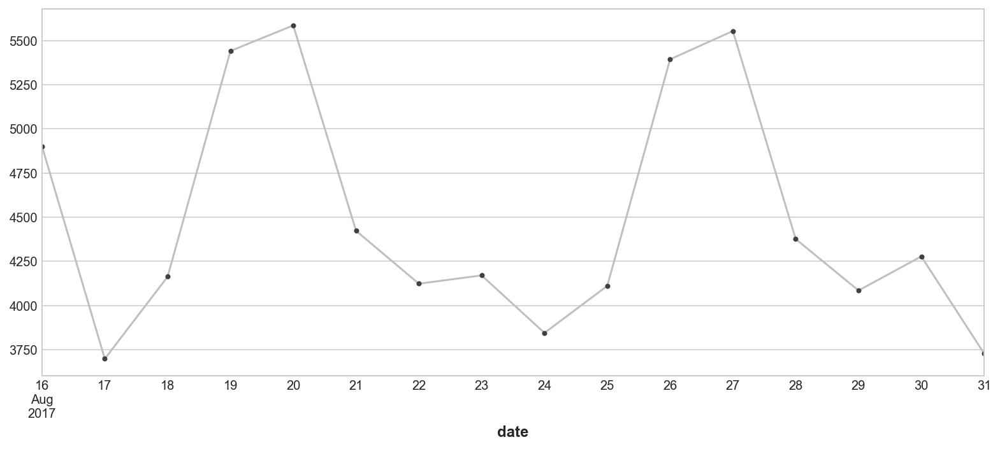

<IPython.core.display.Javascript object>

In [332]:
ax = GROCERY.plot(**plot_params)

On a 15-day prediction scale, we can see a higher variability in the sales rate on Sunday for GROCERY I 

Comparison with the real values (the previous week)

In [340]:
fa_sa = (
    dt_Train.groupby(by=["family", "date"])
    .agg({"sales": "mean"})
    .reset_index()
    .sort_values(by="date", ascending=True)
)
mask = (fa_sa["date"] >= "2017-08-01") & (fa_sa["date"] <= "2017-08-15")

fa_sa = fa_sa.loc[mask]
family_sales2 = fa_sa.groupby(["family", "date"]).mean().unstack("family")
food_sales1 = family_sales2.sales["GROCERY I"]

<IPython.core.display.Javascript object>

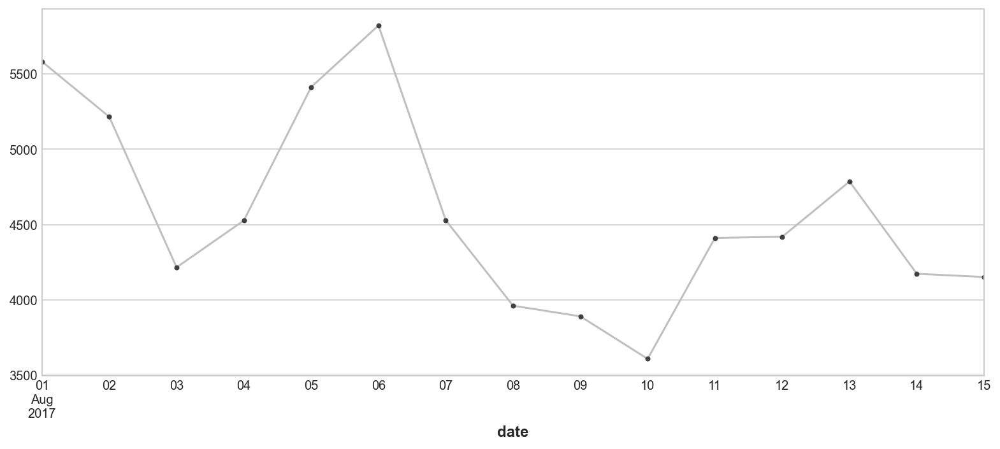

<IPython.core.display.Javascript object>

In [341]:
ax = food_sales1.plot(**plot_params)

Here, we can observe the same variations on the type of product "Grocery". We have well predicted the Test data